## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "language_en"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "language"
target_positive_class = "en"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6213
Epoch 21 Validation Loss: 0.6636
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5918
Epoch 31 Validation Loss: 0.6572
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5663
Epoch 41 Validation Loss: 0.6534
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5438
Epoch 51 Validation Loss: 0.6506
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5236
Epoch 61 Validation Loss: 0.6489
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5053
Epoch 71 Validation Loss: 0.6483
Model saved to train

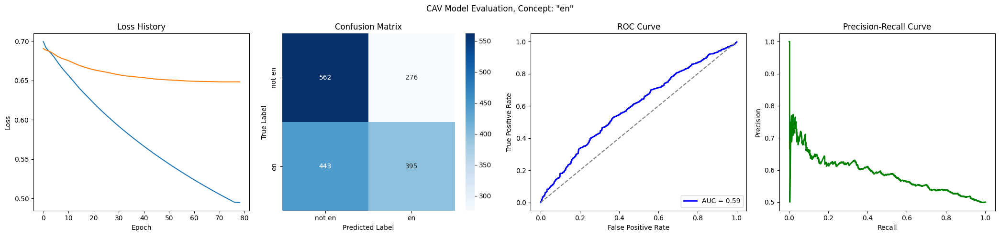

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6662
Epoch 11 Validation Loss: 0.6786
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6416
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6196
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5999
Epoch 41 Validation Loss: 0.6567
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5819
Epoch 51 Validation Loss: 0.6525
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5652
Epoch 61 Validation Loss: 0.6492
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5498
Epoch 71 Validation Loss: 0.6467
Model saved to train

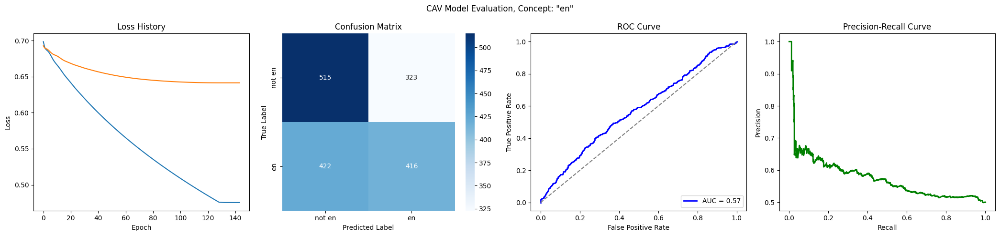

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6636
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6122
Epoch 21 Validation Loss: 0.6472
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5819
Epoch 31 Validation Loss: 0.6372
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5558
Epoch 41 Validation Loss: 0.6310
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5328
Epoch 51 Validation Loss: 0.6271
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5121
Epoch 61 Validation Loss: 0.6246
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4932
Epoch 71 Validation Loss: 0.6231
Model saved to train

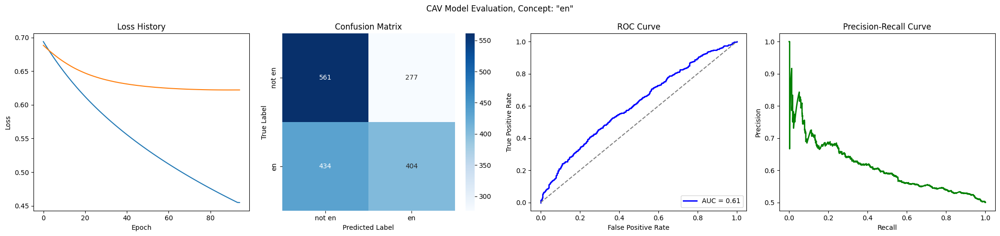

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6122
Epoch 21 Validation Loss: 0.6704
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5804
Epoch 31 Validation Loss: 0.6647
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5528
Epoch 41 Validation Loss: 0.6605
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5283
Epoch 51 Validation Loss: 0.6571
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5064
Epoch 61 Validation Loss: 0.6544
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4866
Epoch 71 Validation Loss: 0.6522
Model saved to train

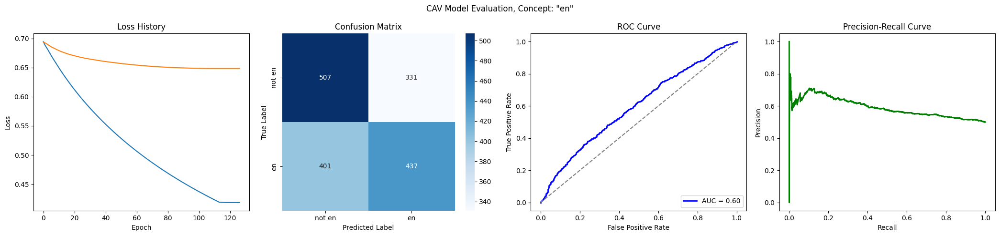

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7052
Epoch 1 Validation Loss: 0.6963
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6649
Epoch 11 Validation Loss: 0.6785
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6367
Epoch 21 Validation Loss: 0.6654
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6127
Epoch 31 Validation Loss: 0.6576
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5917
Epoch 41 Validation Loss: 0.6515
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5728
Epoch 51 Validation Loss: 0.6470
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5556
Epoch 61 Validation Loss: 0.6436
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5395
Epoch 71 Validation Loss: 0.6407
Model saved to train

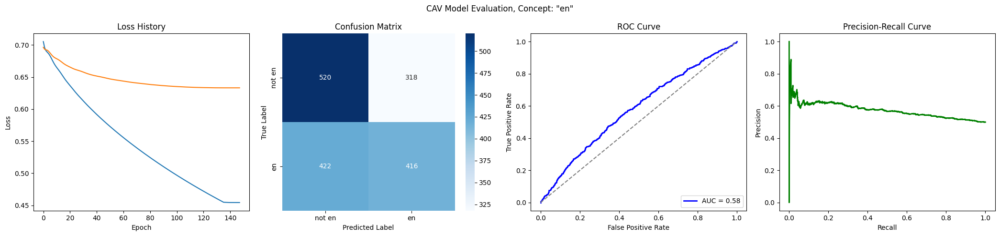

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6713
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5928
Epoch 31 Validation Loss: 0.6689
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5687
Epoch 41 Validation Loss: 0.6685
Early stopping at epoch 44
Loss history saved to trainings/language_en/loss_history.json


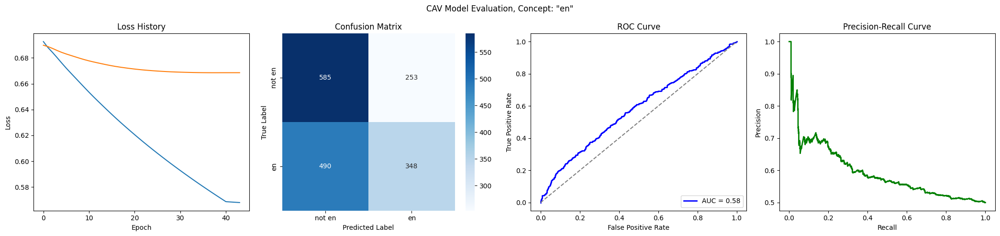

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6498
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6130
Epoch 21 Validation Loss: 0.6666
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5828
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5570
Epoch 41 Validation Loss: 0.6590
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5342
Epoch 51 Validation Loss: 0.6574
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5139
Epoch 61 Validation Loss: 0.6565
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4956
Epoch 71 Validation Loss: 0.6562
Model saved to train

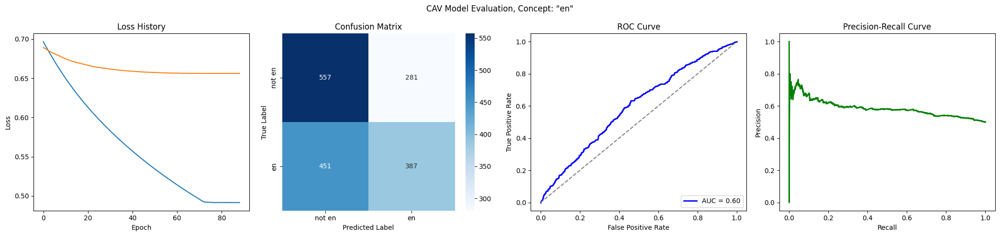

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6730
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6157
Epoch 21 Validation Loss: 0.6590
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5858
Epoch 31 Validation Loss: 0.6506
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5599
Epoch 41 Validation Loss: 0.6454
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5370
Epoch 51 Validation Loss: 0.6422
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5165
Epoch 61 Validation Loss: 0.6400
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4977
Epoch 71 Validation Loss: 0.6383
Model saved to train

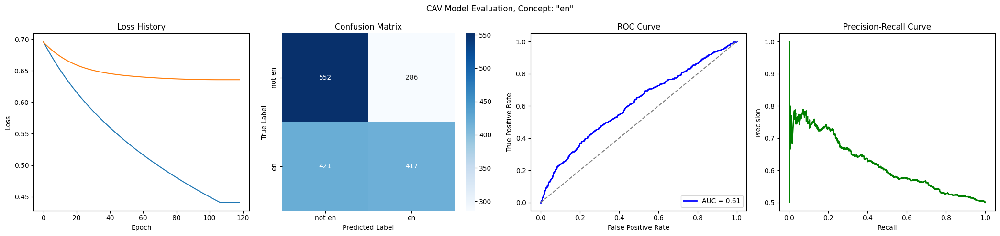

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6622
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6323
Epoch 21 Validation Loss: 0.6636
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6061
Epoch 31 Validation Loss: 0.6575
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5825
Epoch 41 Validation Loss: 0.6540
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5609
Epoch 51 Validation Loss: 0.6521
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5410
Epoch 61 Validation Loss: 0.6513
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5226
Epoch 71 Validation Loss: 0.6511
Model saved to train

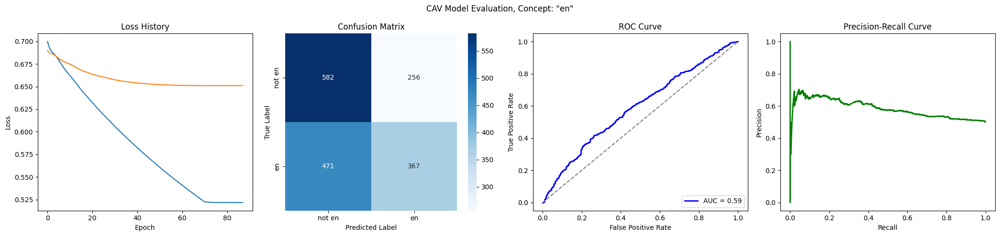

Training run 10/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6537
Epoch 11 Validation Loss: 0.6701
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6210
Epoch 21 Validation Loss: 0.6550
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5931
Epoch 31 Validation Loss: 0.6446
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5685
Epoch 41 Validation Loss: 0.6369
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5465
Epoch 51 Validation Loss: 0.6315
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5267
Epoch 61 Validation Loss: 0.6278
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5086
Epoch 71 Validation Loss: 0.6250
Model saved to trai

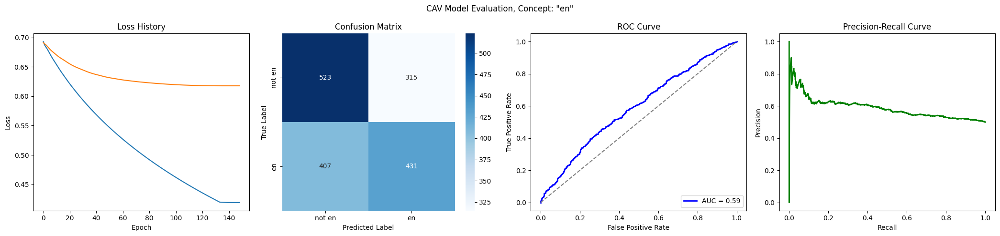

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6584
Epoch 11 Validation Loss: 0.6716
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6246
Epoch 21 Validation Loss: 0.6561
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5965
Epoch 31 Validation Loss: 0.6453
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5722
Epoch 41 Validation Loss: 0.6378
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5507
Epoch 51 Validation Loss: 0.6324
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5313
Epoch 61 Validation Loss: 0.6284
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5136
Epoch 71 Validation Loss: 0.6252
Model saved to trai

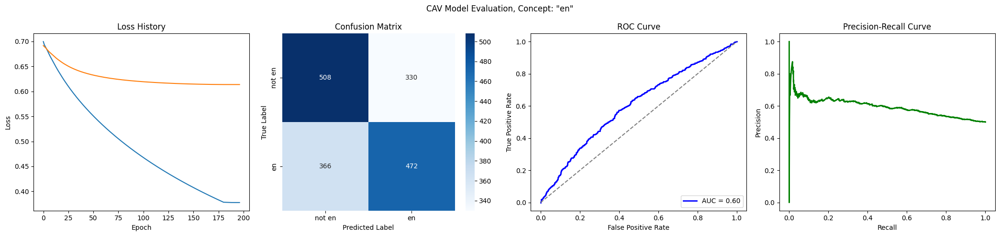

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6744
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6301
Epoch 21 Validation Loss: 0.6606
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6049
Epoch 31 Validation Loss: 0.6513
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5826
Epoch 41 Validation Loss: 0.6445
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5624
Epoch 51 Validation Loss: 0.6390
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5438
Epoch 61 Validation Loss: 0.6345
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5266
Epoch 71 Validation Loss: 0.6309
Model saved to trai

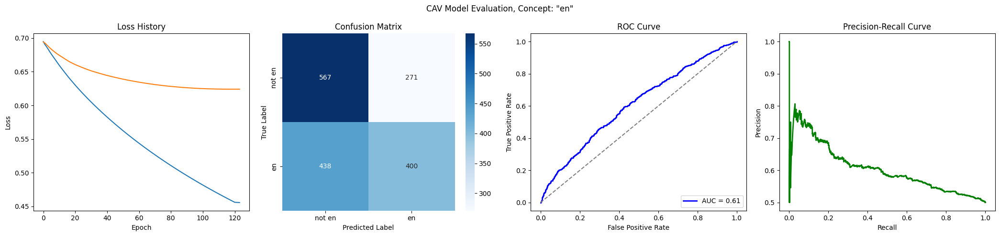

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6532
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6160
Epoch 21 Validation Loss: 0.6685
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5846
Epoch 31 Validation Loss: 0.6636
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5575
Epoch 41 Validation Loss: 0.6609
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5340
Epoch 51 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5132
Epoch 61 Validation Loss: 0.6581
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4946
Epoch 71 Validation Loss: 0.6570
Model saved to trai

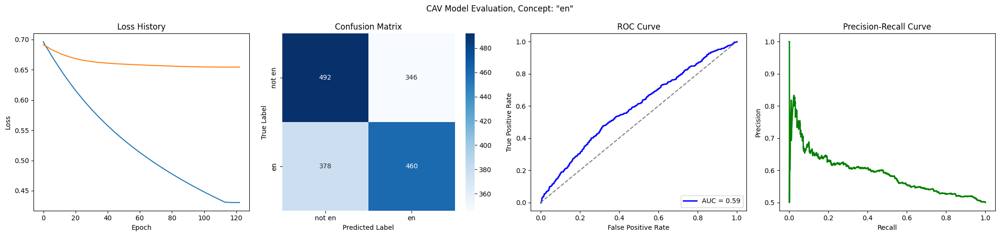

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6577
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6270
Epoch 21 Validation Loss: 0.6610
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6011
Epoch 31 Validation Loss: 0.6524
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5786
Epoch 41 Validation Loss: 0.6468
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5587
Epoch 51 Validation Loss: 0.6438
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5406
Epoch 61 Validation Loss: 0.6425
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5255
Epoch 71 Validation Loss: 0.6420
Early stopping at e

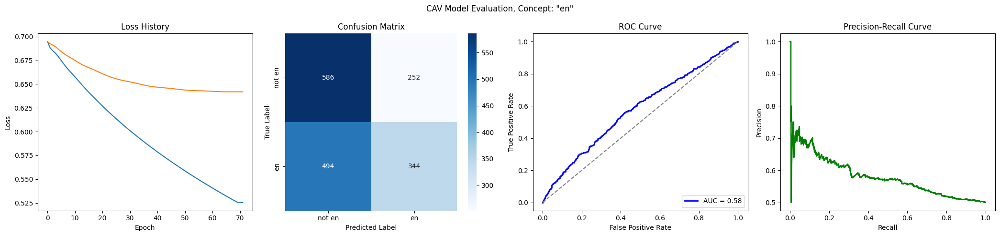

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6902
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6234
Epoch 21 Validation Loss: 0.6765
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5977
Epoch 31 Validation Loss: 0.6727
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5751
Epoch 41 Validation Loss: 0.6696
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5548
Epoch 51 Validation Loss: 0.6678
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5364
Epoch 61 Validation Loss: 0.6672
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5322
Epoch 71 Validation Loss: 0.6672
Model saved to trai

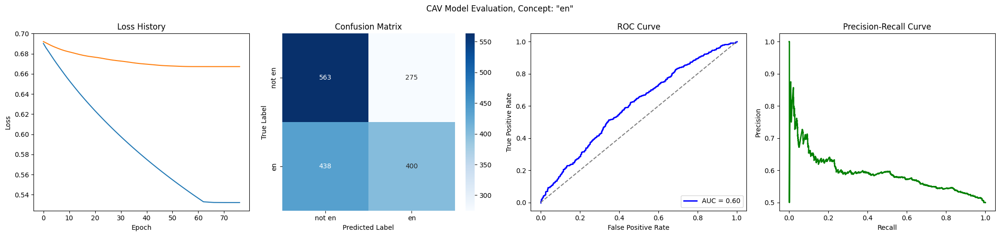

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6582
Epoch 11 Validation Loss: 0.6942
Early stopping at epoch 13
Loss history saved to trainings/language_en/loss_history.json


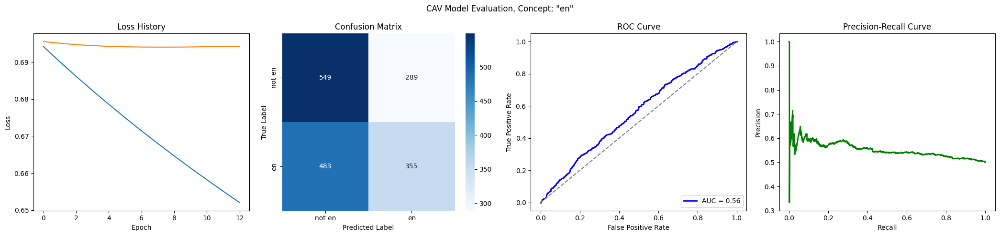

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6532
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6162
Epoch 21 Validation Loss: 0.6739
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5866
Epoch 31 Validation Loss: 0.6701
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5616
Epoch 41 Validation Loss: 0.6679
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5397
Epoch 51 Validation Loss: 0.6663
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5200
Epoch 61 Validation Loss: 0.6650
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5021
Epoch 71 Validation Loss: 0.6640
Model saved to trai

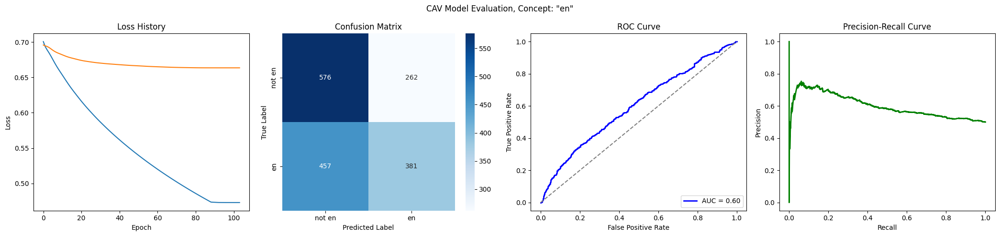

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6599
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6288
Epoch 21 Validation Loss: 0.6656
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6026
Epoch 31 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5793
Epoch 41 Validation Loss: 0.6547
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5582
Epoch 51 Validation Loss: 0.6515
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5388
Epoch 61 Validation Loss: 0.6494
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5210
Epoch 71 Validation Loss: 0.6483
Model saved to trai

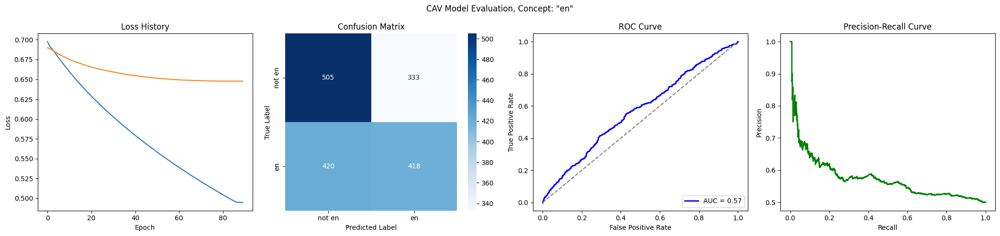

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6505
Epoch 11 Validation Loss: 0.6757
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6161
Epoch 21 Validation Loss: 0.6655
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5893
Epoch 31 Validation Loss: 0.6580
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5662
Epoch 41 Validation Loss: 0.6507
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5453
Epoch 51 Validation Loss: 0.6438
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5261
Epoch 61 Validation Loss: 0.6379
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5084
Epoch 71 Validation Loss: 0.6330
Model saved to trai

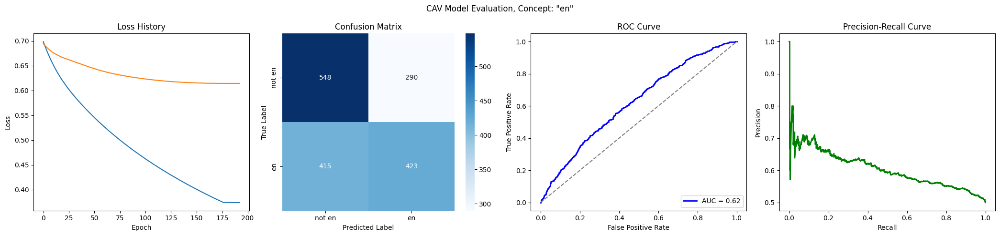

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6510
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6150
Epoch 21 Validation Loss: 0.6604
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5855
Epoch 31 Validation Loss: 0.6525
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5600
Epoch 41 Validation Loss: 0.6465
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5375
Epoch 51 Validation Loss: 0.6416
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5173
Epoch 61 Validation Loss: 0.6379
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4990
Epoch 71 Validation Loss: 0.6352
Model saved to trai

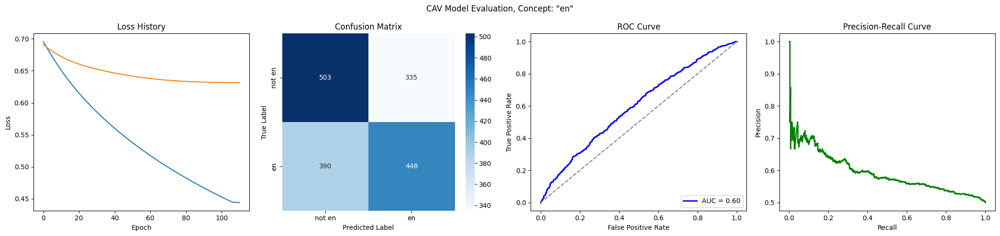

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7002
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6571
Epoch 11 Validation Loss: 0.6740
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6220
Epoch 21 Validation Loss: 0.6592
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5926
Epoch 31 Validation Loss: 0.6492
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5674
Epoch 41 Validation Loss: 0.6423
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5452
Epoch 51 Validation Loss: 0.6373
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5254
Epoch 61 Validation Loss: 0.6338
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5076
Epoch 71 Validation Loss: 0.6315
Model saved to trai

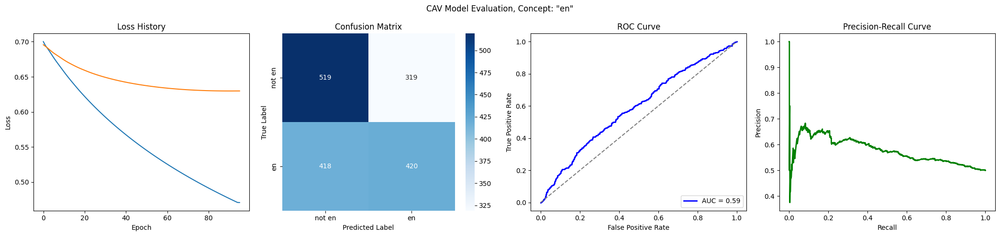

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6569
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/language_en/loss_history.json


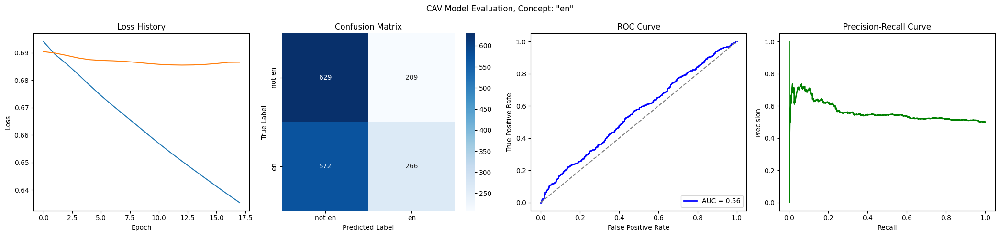

Training run 23/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6878
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6515
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6750
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5938
Epoch 31 Validation Loss: 0.6720
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5704
Epoch 41 Validation Loss: 0.6702
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5495
Epoch 51 Validation Loss: 0.6687
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5307
Epoch 61 Validation Loss: 0.6675
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5135
Epoch 71 Validation Loss: 0.6663
Model saved to trai

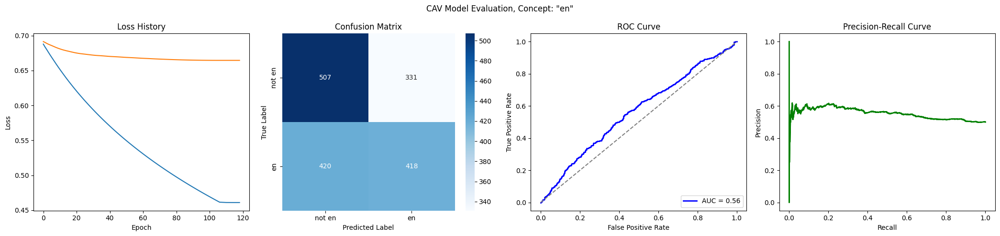

Training run 24/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7081
Epoch 1 Validation Loss: 0.6984
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6658
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6346
Epoch 21 Validation Loss: 0.6770
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6073
Epoch 31 Validation Loss: 0.6714
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5836
Epoch 41 Validation Loss: 0.6688
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5626
Epoch 51 Validation Loss: 0.6674
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5438
Epoch 61 Validation Loss: 0.6670
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 66
Loss history saved to trainings/language_en/loss_history.json


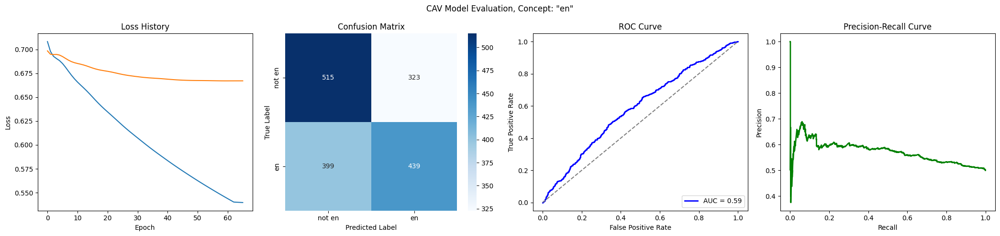

Training run 25/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5749
Epoch 61 Validation Loss: 0.6726
Early stopping at epoch 65
Loss history saved to trainings/language_en/loss_history.json


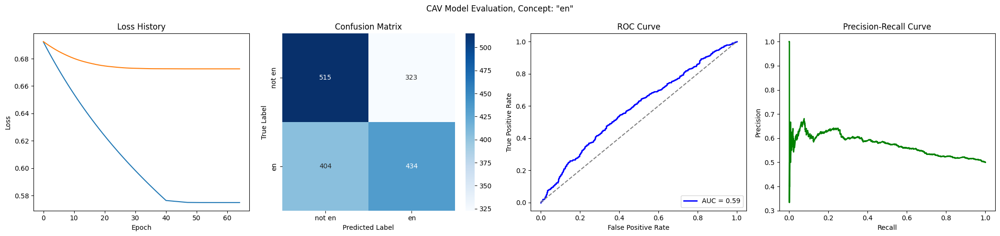

Training run 31/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7028
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6672
Epoch 11 Validation Loss: 0.6804
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6393
Epoch 21 Validation Loss: 0.6705
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6143
Epoch 31 Validation Loss: 0.6643
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5917
Epoch 41 Validation Loss: 0.6618
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5745
Epoch 51 Validation Loss: 0.6614
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5725
Epoch 61 Validation Loss: 0.6611
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5705
Epoch 71 Validation Loss: 0.6610
Model saved to trai

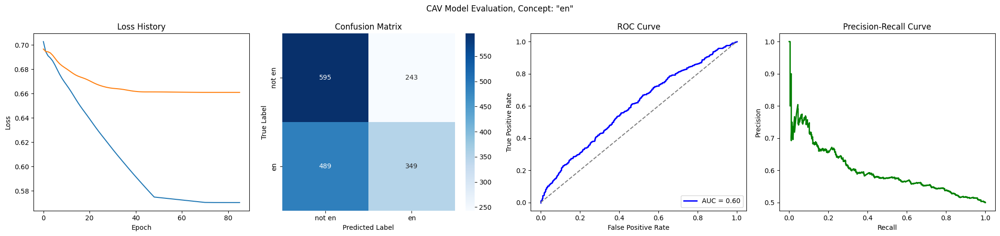

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6902
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6576
Epoch 11 Validation Loss: 0.6789
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6302
Epoch 21 Validation Loss: 0.6706
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6062
Epoch 31 Validation Loss: 0.6655
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5846
Epoch 41 Validation Loss: 0.6620
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5650
Epoch 51 Validation Loss: 0.6596
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5470
Epoch 61 Validation Loss: 0.6579
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5303
Epoch 71 Validation Loss: 0.6567
Model saved to trai

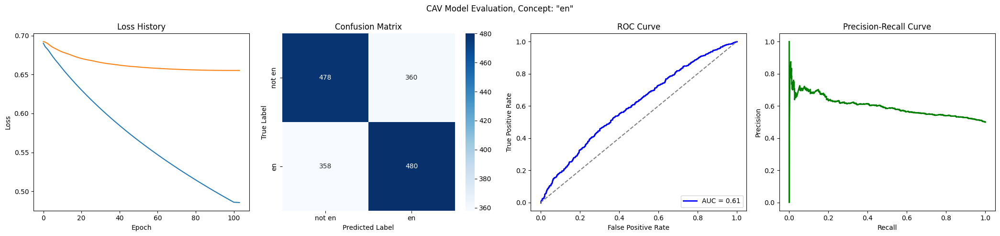

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6989
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6880
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6177
Epoch 21 Validation Loss: 0.6821
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5877
Epoch 31 Validation Loss: 0.6806
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5663
Epoch 41 Validation Loss: 0.6804
Early stopping at epoch 41
Loss history saved to trainings/language_en/loss_history.json


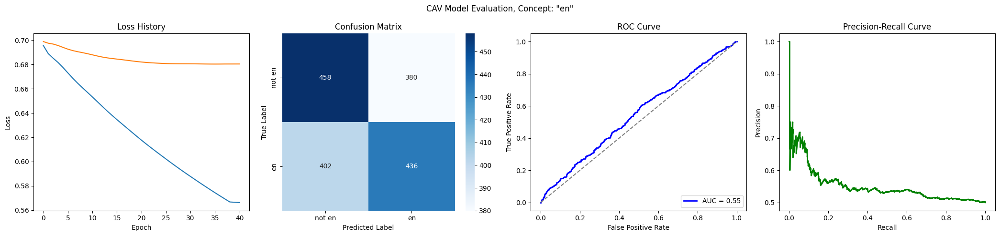

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6590
Epoch 11 Validation Loss: 0.6699
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6274
Epoch 21 Validation Loss: 0.6540
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6002
Epoch 31 Validation Loss: 0.6435
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5764
Epoch 41 Validation Loss: 0.6371
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5551
Epoch 51 Validation Loss: 0.6334
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5360
Epoch 61 Validation Loss: 0.6313
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5187
Epoch 71 Validation Loss: 0.6301
Model saved to trai

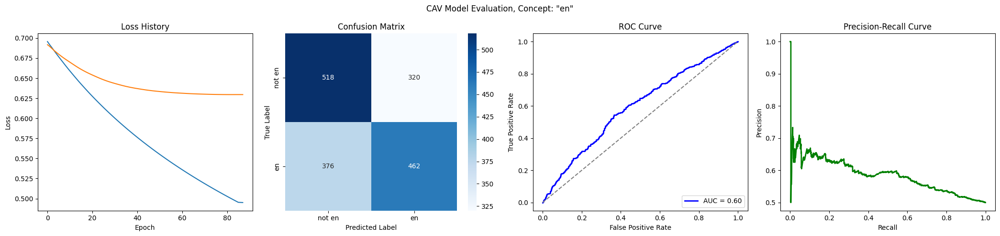

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6506
Epoch 11 Validation Loss: 0.6769
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6188
Epoch 21 Validation Loss: 0.6689
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5929
Epoch 31 Validation Loss: 0.6629
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5703
Epoch 41 Validation Loss: 0.6575
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5502
Epoch 51 Validation Loss: 0.6532
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5321
Epoch 61 Validation Loss: 0.6502
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5155
Epoch 71 Validation Loss: 0.6482
Model saved to trai

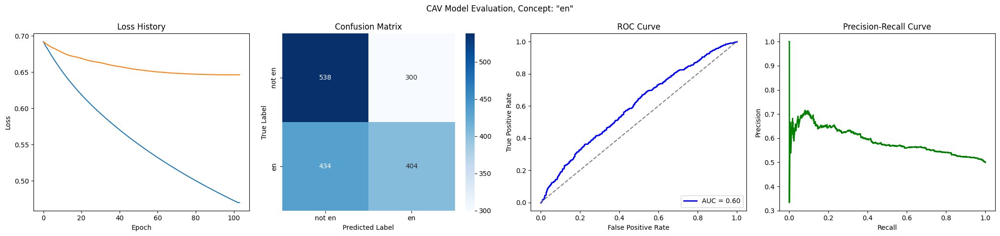

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6448
Epoch 11 Validation Loss: 0.6733
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6079
Epoch 21 Validation Loss: 0.6616
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5774
Epoch 31 Validation Loss: 0.6542
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5512
Epoch 41 Validation Loss: 0.6499
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5284
Epoch 51 Validation Loss: 0.6480
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5098
Epoch 61 Validation Loss: 0.6477
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5092
Epoch 71 Validation Loss: 0.6477
Early stopping at e

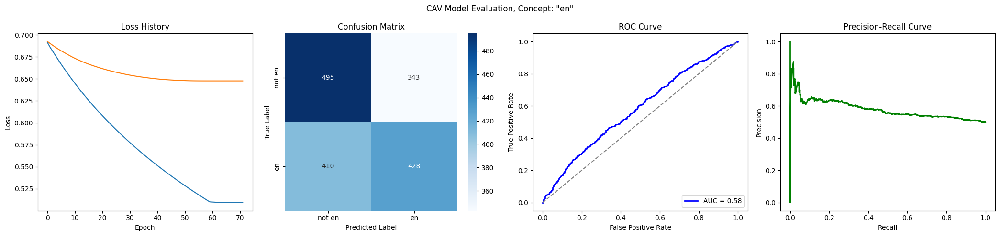

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6189
Epoch 21 Validation Loss: 0.6731
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5919
Epoch 31 Validation Loss: 0.6702
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5687
Epoch 41 Validation Loss: 0.6685
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5478
Epoch 51 Validation Loss: 0.6671
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5286
Epoch 61 Validation Loss: 0.6661
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5108
Epoch 71 Validation Loss: 0.6657
Model saved to trai

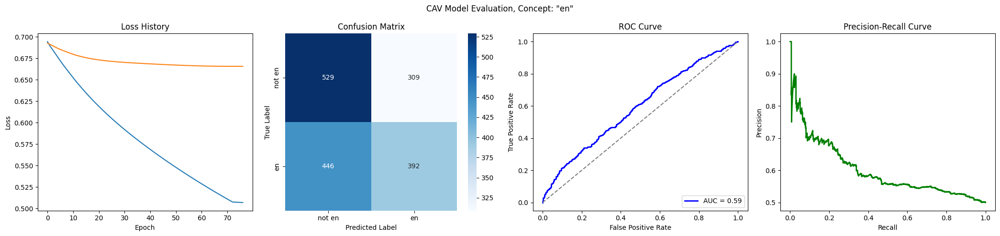

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6604
Epoch 11 Validation Loss: 0.6801
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6294
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6032
Epoch 31 Validation Loss: 0.6622
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5802
Epoch 41 Validation Loss: 0.6588
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5595
Epoch 51 Validation Loss: 0.6571
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5405
Epoch 61 Validation Loss: 0.6562
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5229
Epoch 71 Validation Loss: 0.6558
Model saved to trai

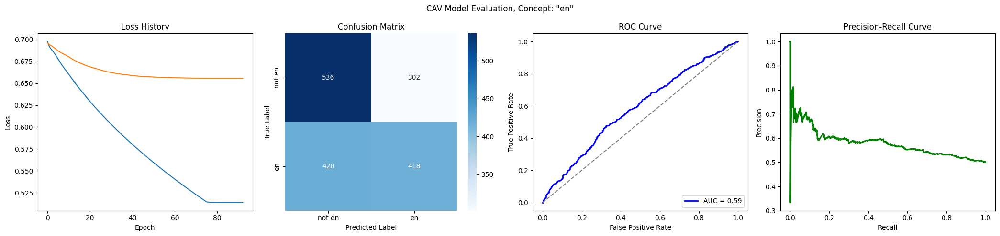

Training run 39/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6245
Epoch 21 Validation Loss: 0.6738
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5976
Epoch 31 Validation Loss: 0.6698
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5739
Epoch 41 Validation Loss: 0.6672
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5526
Epoch 51 Validation Loss: 0.6655
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5333
Epoch 61 Validation Loss: 0.6642
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5156
Epoch 71 Validation Loss: 0.6633
Model saved to trai

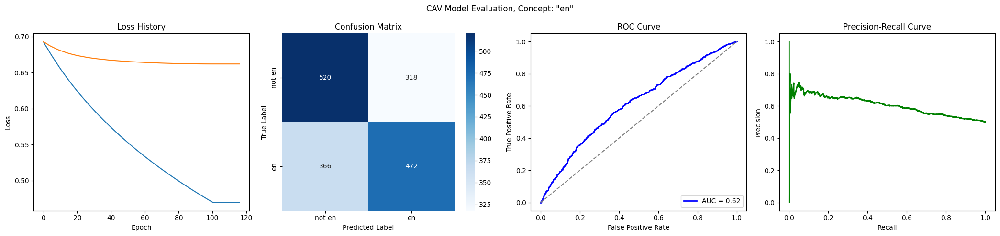

Training run 40/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6507
Epoch 11 Validation Loss: 0.6853
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6164
Epoch 21 Validation Loss: 0.6843
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 27
Loss history saved to trainings/language_en/loss_history.json


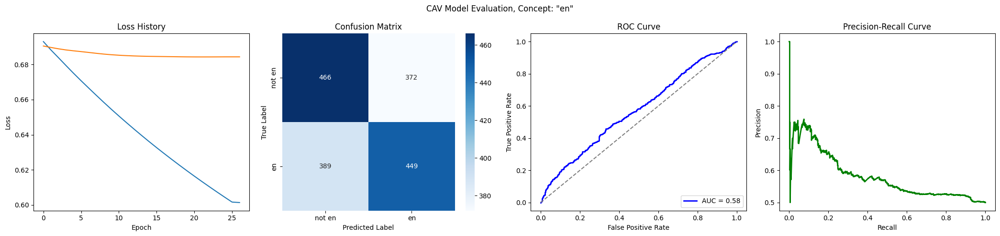

Training run 41/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6775
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6300
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6057
Epoch 31 Validation Loss: 0.6636
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5845
Epoch 41 Validation Loss: 0.6607
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5655
Epoch 51 Validation Loss: 0.6584
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5482
Epoch 61 Validation Loss: 0.6565
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5323
Epoch 71 Validation Loss: 0.6550
Model saved to trai

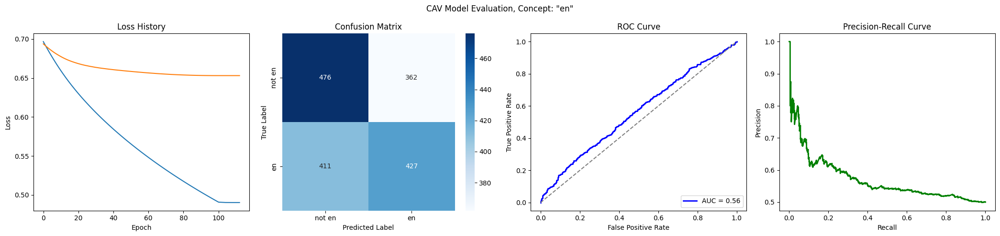

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6565
Epoch 11 Validation Loss: 0.6682
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6244
Epoch 21 Validation Loss: 0.6520
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5976
Epoch 31 Validation Loss: 0.6425
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5746
Epoch 41 Validation Loss: 0.6368
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5539
Epoch 51 Validation Loss: 0.6327
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5350
Epoch 61 Validation Loss: 0.6301
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5175
Epoch 71 Validation Loss: 0.6283
Model saved to trai

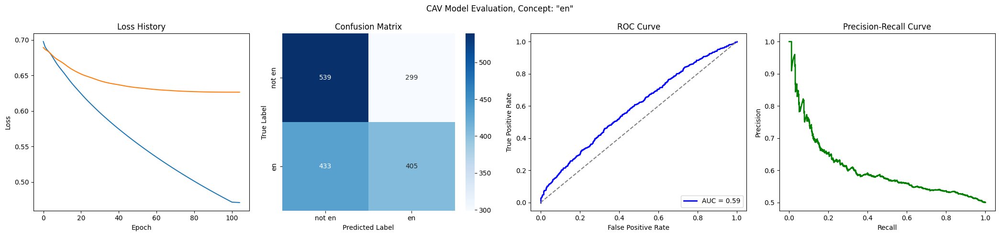

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6248
Epoch 21 Validation Loss: 0.6718
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5973
Epoch 31 Validation Loss: 0.6689
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5730
Epoch 41 Validation Loss: 0.6681
Early stopping at epoch 44
Loss history saved to trainings/language_en/loss_history.json


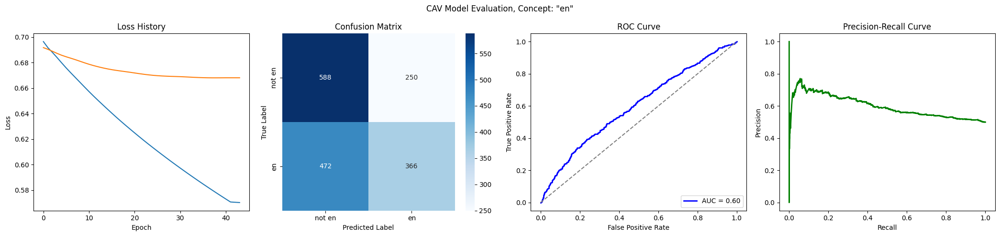

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6776
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6282
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6018
Epoch 31 Validation Loss: 0.6634
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5788
Epoch 41 Validation Loss: 0.6601
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5582
Epoch 51 Validation Loss: 0.6579
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5395
Epoch 61 Validation Loss: 0.6563
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5222
Epoch 71 Validation Loss: 0.6553
Model saved to trai

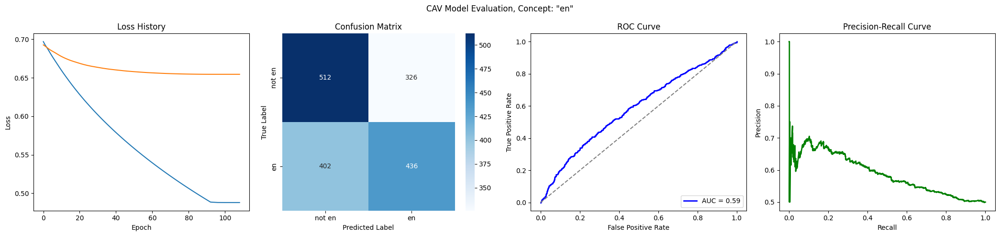

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6621
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6307
Epoch 21 Validation Loss: 0.6706
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6043
Epoch 31 Validation Loss: 0.6645
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5813
Epoch 41 Validation Loss: 0.6607
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5607
Epoch 51 Validation Loss: 0.6586
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5422
Epoch 61 Validation Loss: 0.6572
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5251
Epoch 71 Validation Loss: 0.6563
Model saved to trai

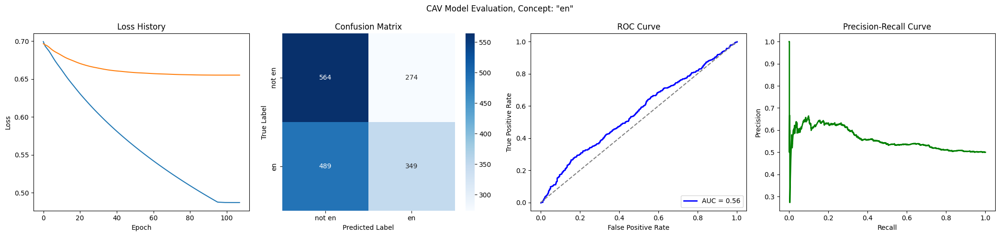

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6958
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6602
Epoch 11 Validation Loss: 0.6825
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6302
Epoch 21 Validation Loss: 0.6761
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6054
Epoch 31 Validation Loss: 0.6735
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5835
Epoch 41 Validation Loss: 0.6720
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5639
Epoch 51 Validation Loss: 0.6716
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 56
Loss history saved to trainings/language_en/loss_history.json


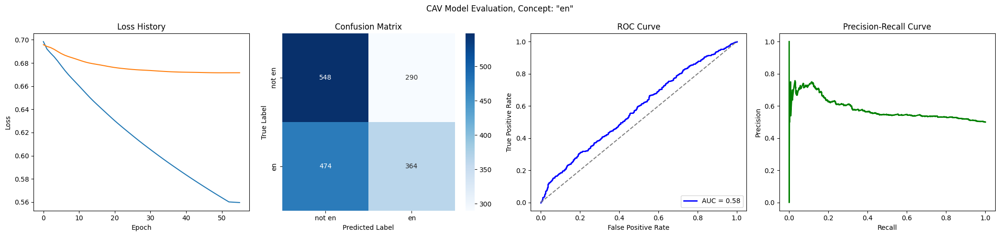

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6754
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6077
Epoch 21 Validation Loss: 0.6676
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5786
Epoch 31 Validation Loss: 0.6634
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5537
Epoch 41 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5313
Epoch 51 Validation Loss: 0.6555
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5109
Epoch 61 Validation Loss: 0.6522
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4921
Epoch 71 Validation Loss: 0.6499
Model saved to trai

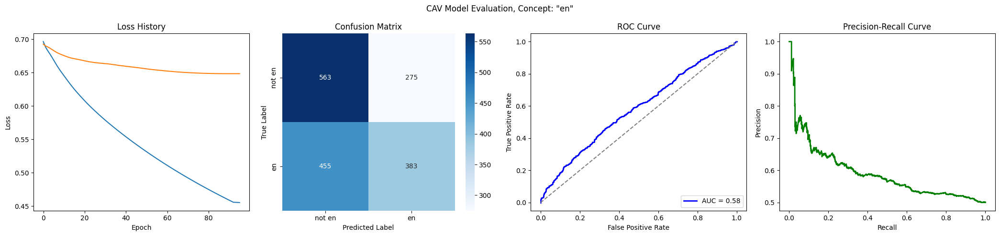

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6959
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6704
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6193
Epoch 21 Validation Loss: 0.6539
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5912
Epoch 31 Validation Loss: 0.6433
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5667
Epoch 41 Validation Loss: 0.6369
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5450
Epoch 51 Validation Loss: 0.6335
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5256
Epoch 61 Validation Loss: 0.6318
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5079
Epoch 71 Validation Loss: 0.6309
Model saved to trai

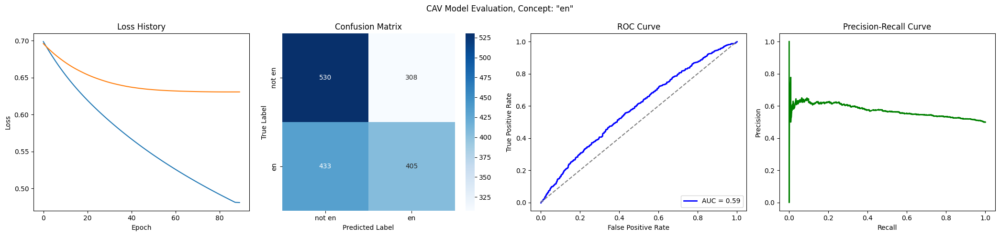

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6548
Epoch 11 Validation Loss: 0.6670
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6250
Epoch 21 Validation Loss: 0.6522
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5996
Epoch 31 Validation Loss: 0.6431
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5767
Epoch 41 Validation Loss: 0.6375
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5559
Epoch 51 Validation Loss: 0.6340
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5369
Epoch 61 Validation Loss: 0.6321
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5193
Epoch 71 Validation Loss: 0.6313
Model saved to trai

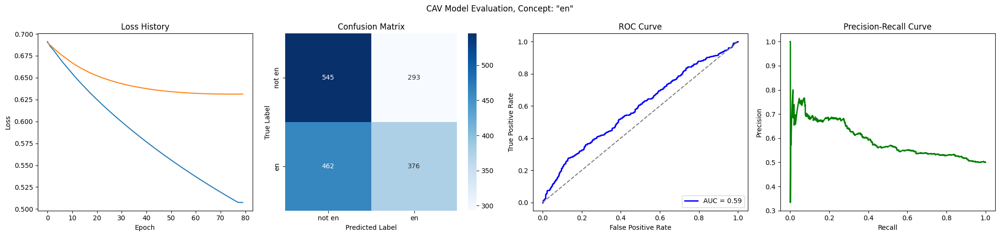

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6872
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6249
Epoch 21 Validation Loss: 0.6865
Early stopping at epoch 21
Loss history saved to trainings/language_en/loss_history.json


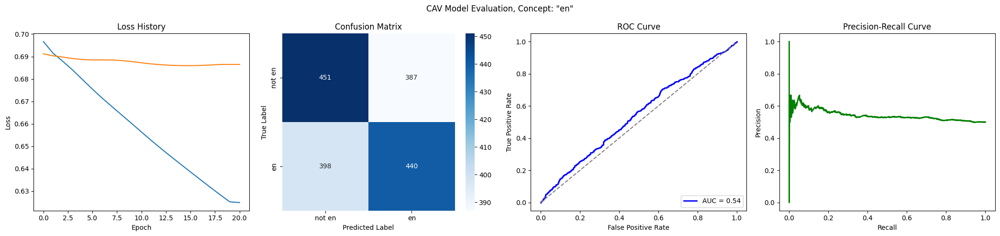

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6745
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6255
Epoch 21 Validation Loss: 0.6630
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5972
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5722
Epoch 41 Validation Loss: 0.6499
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5498
Epoch 51 Validation Loss: 0.6456
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5296
Epoch 61 Validation Loss: 0.6424
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5113
Epoch 71 Validation Loss: 0.6401
Model saved to trai

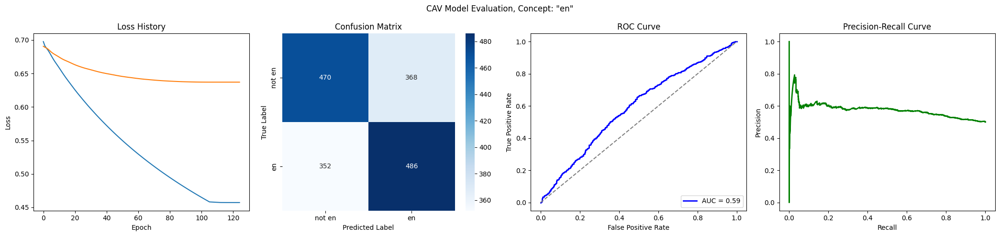

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6844
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6194
Epoch 21 Validation Loss: 0.6819
Early stopping at epoch 25
Loss history saved to trainings/language_en/loss_history.json


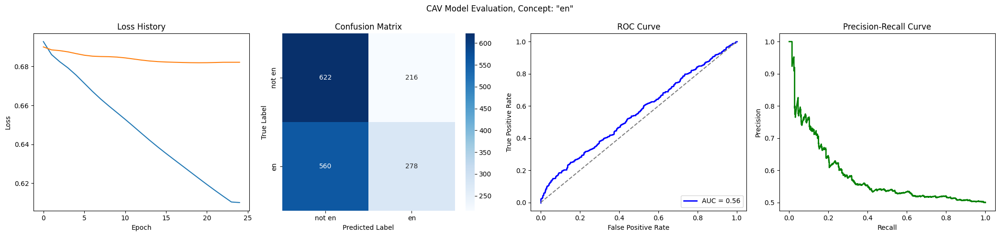

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7069
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6581
Epoch 11 Validation Loss: 0.6699
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6237
Epoch 21 Validation Loss: 0.6541
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6436
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5715
Epoch 41 Validation Loss: 0.6374
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5508
Epoch 51 Validation Loss: 0.6334
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5324
Epoch 61 Validation Loss: 0.6311
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5155
Epoch 71 Validation Loss: 0.6299
Model saved to trai

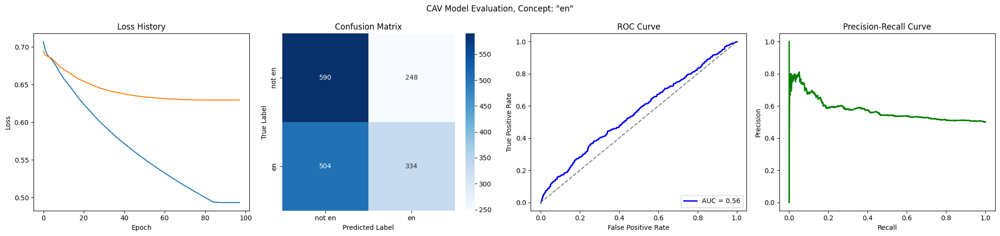

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6652
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6401
Epoch 21 Validation Loss: 0.6678
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6187
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5993
Epoch 41 Validation Loss: 0.6576
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5816
Epoch 51 Validation Loss: 0.6548
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5651
Epoch 61 Validation Loss: 0.6529
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5495
Epoch 71 Validation Loss: 0.6517
Model saved to trai

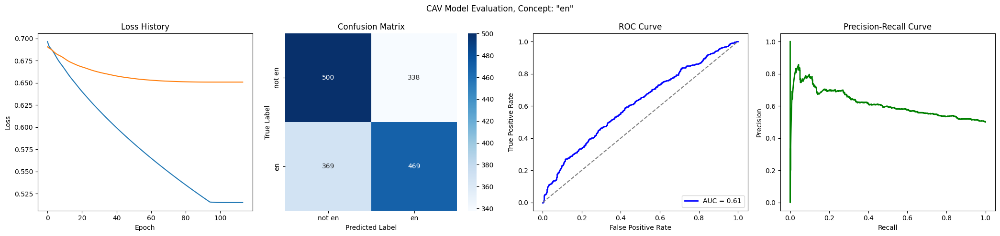

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6521
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6207
Epoch 21 Validation Loss: 0.6844
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5953
Epoch 31 Validation Loss: 0.6831
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5738
Epoch 41 Validation Loss: 0.6821
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5598
Epoch 51 Validation Loss: 0.6820
Early stopping at epoch 51
Loss history saved to trainings/language_en/loss_history.json


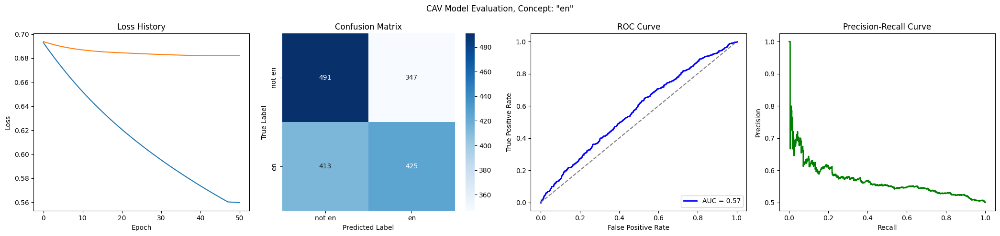

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6860
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6234
Epoch 21 Validation Loss: 0.6820
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5965
Epoch 31 Validation Loss: 0.6797
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5733
Epoch 41 Validation Loss: 0.6779
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5528
Epoch 51 Validation Loss: 0.6769
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5360
Epoch 61 Validation Loss: 0.6768
Early stopping at epoch 61
Loss history saved to trainings/language_en/loss_history.json


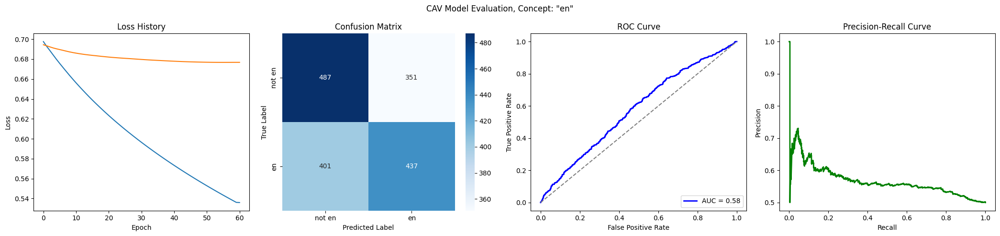

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6615
Epoch 11 Validation Loss: 0.6823
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6303
Epoch 21 Validation Loss: 0.6721
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6035
Epoch 31 Validation Loss: 0.6646
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5801
Epoch 41 Validation Loss: 0.6586
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5594
Epoch 51 Validation Loss: 0.6534
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5407
Epoch 61 Validation Loss: 0.6488
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5236
Epoch 71 Validation Loss: 0.6449
Model saved to trai

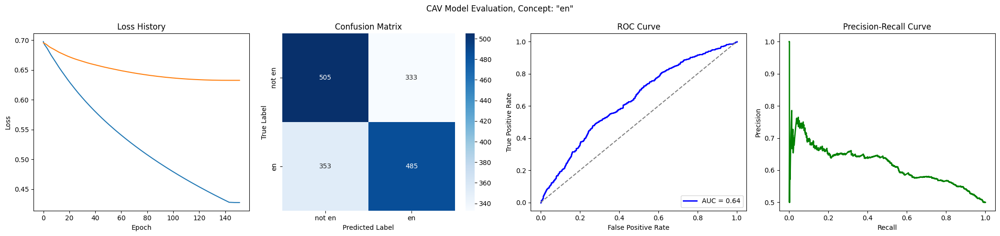

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6514
Epoch 11 Validation Loss: 0.6866
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/language_en/loss_history.json


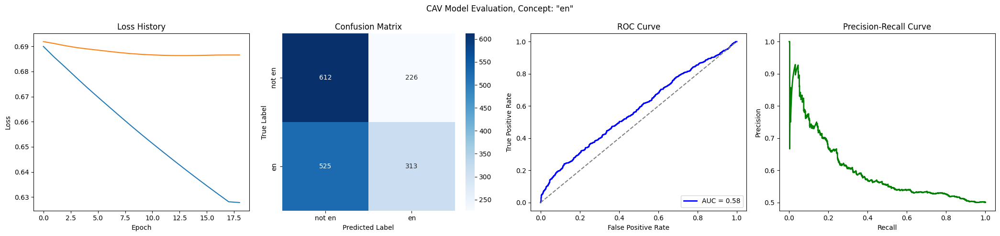

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7019
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/language_en/loss_history.json


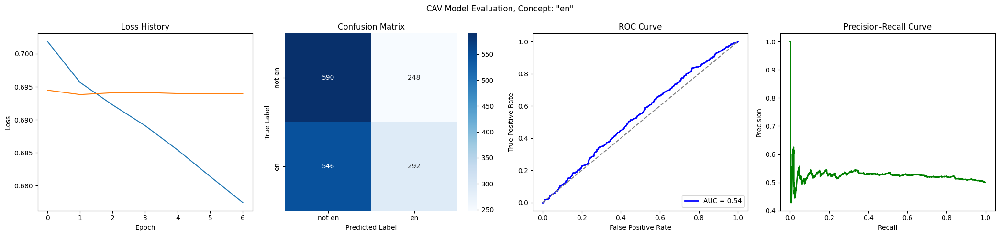

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6542
Epoch 11 Validation Loss: 0.6775
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6225
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5957
Epoch 31 Validation Loss: 0.6612
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5722
Epoch 41 Validation Loss: 0.6548
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5511
Epoch 51 Validation Loss: 0.6490
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5319
Epoch 61 Validation Loss: 0.6441
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5142
Epoch 71 Validation Loss: 0.6403
Model saved to trai

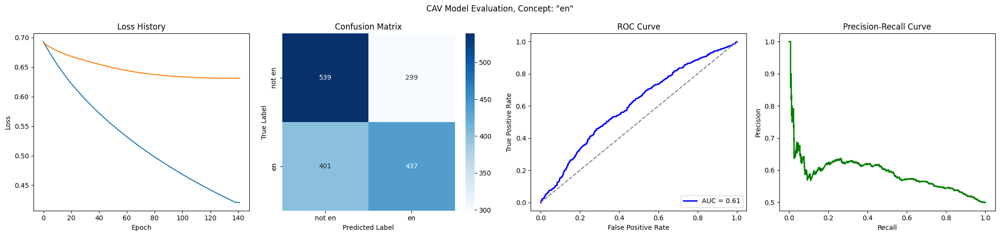

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6568
Epoch 11 Validation Loss: 0.6700
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6232
Epoch 21 Validation Loss: 0.6557
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5946
Epoch 31 Validation Loss: 0.6435
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5699
Epoch 41 Validation Loss: 0.6350
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5479
Epoch 51 Validation Loss: 0.6285
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5278
Epoch 61 Validation Loss: 0.6229
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5094
Epoch 71 Validation Loss: 0.6188
Model saved to trai

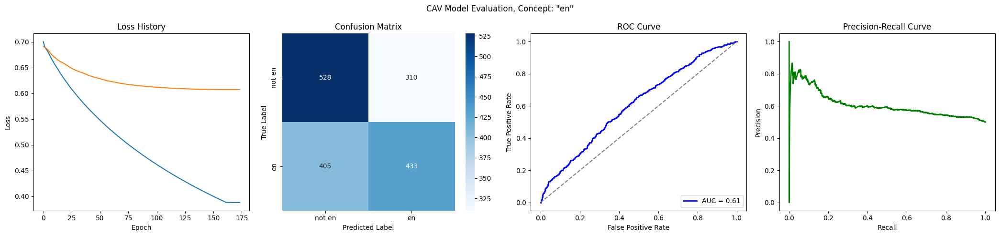

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6726
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6214
Epoch 21 Validation Loss: 0.6568
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5947
Epoch 31 Validation Loss: 0.6453
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5716
Epoch 41 Validation Loss: 0.6364
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5510
Epoch 51 Validation Loss: 0.6293
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5323
Epoch 61 Validation Loss: 0.6237
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5152
Epoch 71 Validation Loss: 0.6192
Model saved to trai

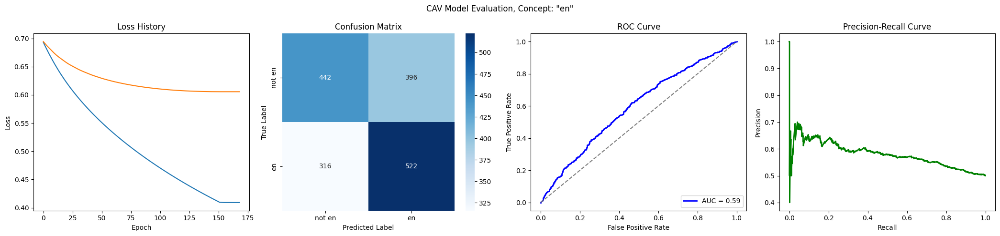

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6986
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6631
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6328
Epoch 21 Validation Loss: 0.6716
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6068
Epoch 31 Validation Loss: 0.6674
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5839
Epoch 41 Validation Loss: 0.6664
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 47
Loss history saved to trainings/language_en/loss_history.json


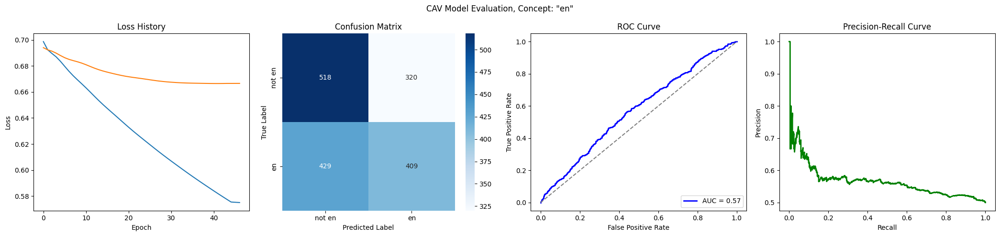

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6558
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6246
Epoch 21 Validation Loss: 0.6623
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5973
Epoch 31 Validation Loss: 0.6500
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5728
Epoch 41 Validation Loss: 0.6398
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5506
Epoch 51 Validation Loss: 0.6316
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5303
Epoch 61 Validation Loss: 0.6251
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5117
Epoch 71 Validation Loss: 0.6201
Model saved to trai

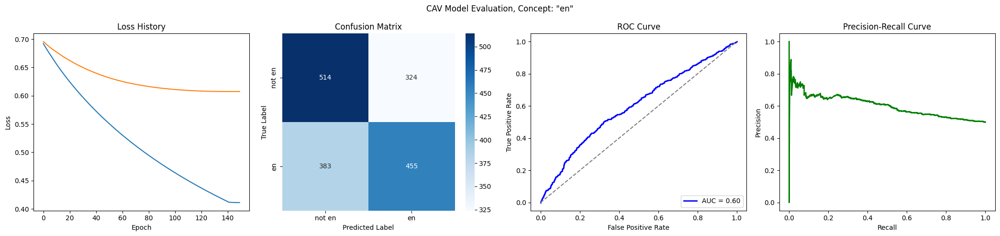

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7043
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6671
Epoch 11 Validation Loss: 0.6867
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6376
Epoch 21 Validation Loss: 0.6840
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6119
Epoch 31 Validation Loss: 0.6829
Early stopping at epoch 33
Loss history saved to trainings/language_en/loss_history.json


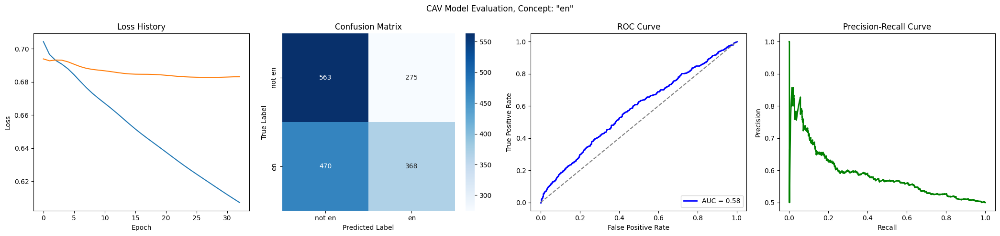

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6630
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6329
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6075
Epoch 31 Validation Loss: 0.6656
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5850
Epoch 41 Validation Loss: 0.6626
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5648
Epoch 51 Validation Loss: 0.6606
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5465
Epoch 61 Validation Loss: 0.6591
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5297
Epoch 71 Validation Loss: 0.6578
Model saved to trai

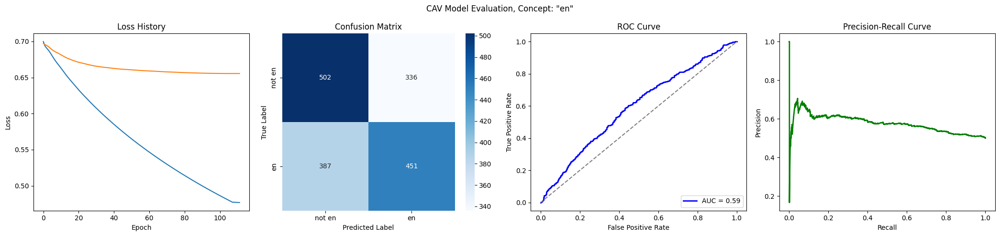

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6600
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6305
Epoch 21 Validation Loss: 0.6788
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6047
Epoch 31 Validation Loss: 0.6769
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5814
Epoch 41 Validation Loss: 0.6766
Early stopping at epoch 44
Loss history saved to trainings/language_en/loss_history.json


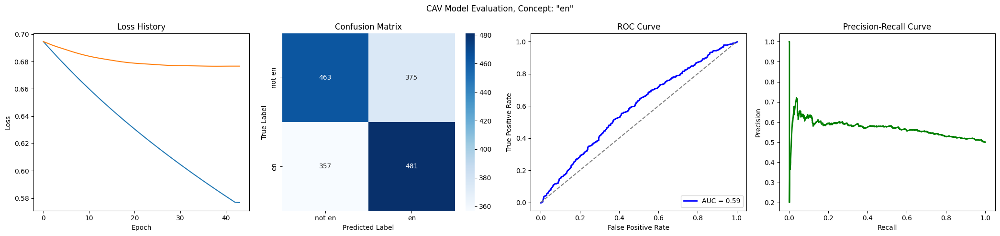

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6578
Epoch 11 Validation Loss: 0.6748
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6255
Epoch 21 Validation Loss: 0.6610
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5975
Epoch 31 Validation Loss: 0.6522
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5728
Epoch 41 Validation Loss: 0.6465
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5507
Epoch 51 Validation Loss: 0.6427
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5309
Epoch 61 Validation Loss: 0.6401
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5128
Epoch 71 Validation Loss: 0.6381
Model saved to trai

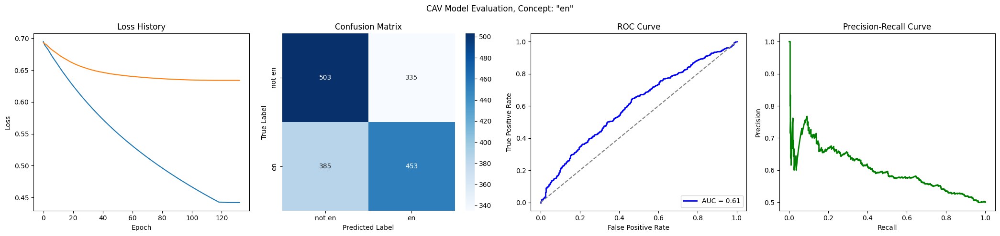

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6507
Epoch 11 Validation Loss: 0.6865
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/language_en/loss_history.json


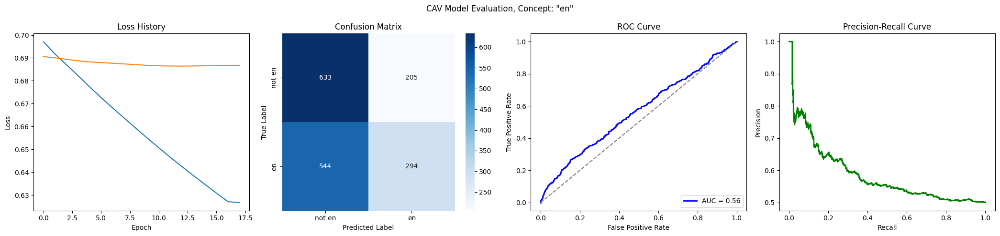

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7068
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6621
Epoch 11 Validation Loss: 0.6726
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6322
Epoch 21 Validation Loss: 0.6579
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6054
Epoch 31 Validation Loss: 0.6456
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5817
Epoch 41 Validation Loss: 0.6366
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5605
Epoch 51 Validation Loss: 0.6285
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5414
Epoch 61 Validation Loss: 0.6224
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5241
Epoch 71 Validation Loss: 0.6171
Model saved to trai

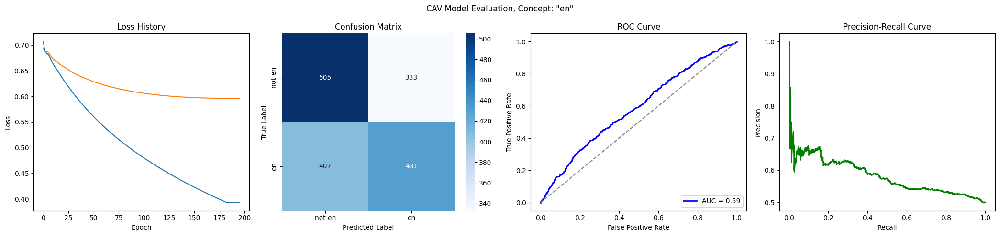

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6613
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6333
Epoch 21 Validation Loss: 0.6712
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6082
Epoch 31 Validation Loss: 0.6663
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5855
Epoch 41 Validation Loss: 0.6638
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5648
Epoch 51 Validation Loss: 0.6630
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/language_en/loss_history.json


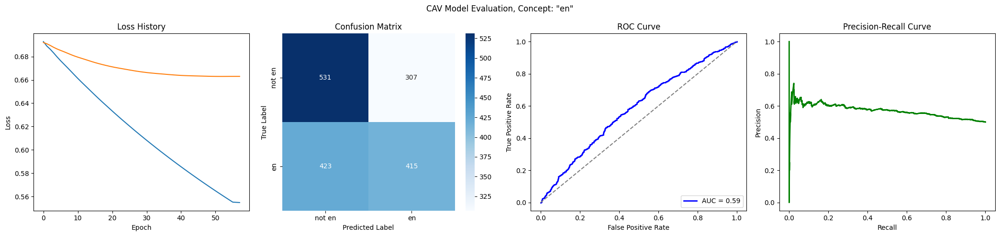

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6725
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6265
Epoch 21 Validation Loss: 0.6587
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5993
Epoch 31 Validation Loss: 0.6511
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5754
Epoch 41 Validation Loss: 0.6471
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5541
Epoch 51 Validation Loss: 0.6447
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5348
Epoch 61 Validation Loss: 0.6432
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5172
Epoch 71 Validation Loss: 0.6423
Model saved to trai

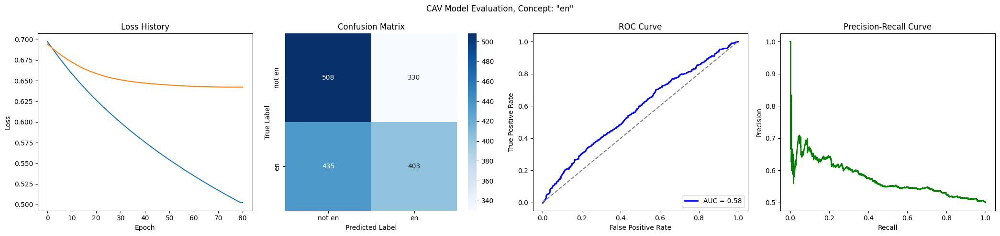

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6502
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6153
Epoch 21 Validation Loss: 0.6653
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5857
Epoch 31 Validation Loss: 0.6598
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5604
Epoch 41 Validation Loss: 0.6570
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5381
Epoch 51 Validation Loss: 0.6554
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5182
Epoch 61 Validation Loss: 0.6545
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5001
Epoch 71 Validation Loss: 0.6539
Model saved to trai

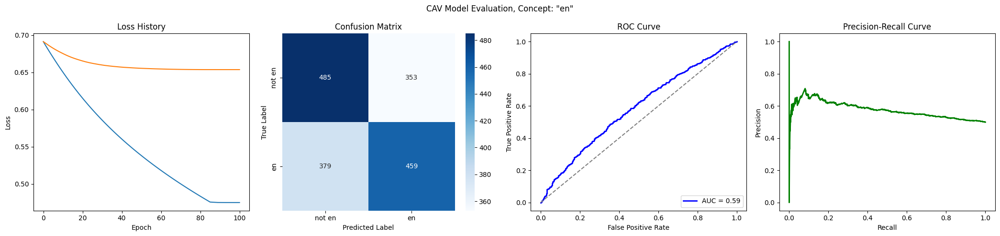

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6603
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6277
Epoch 21 Validation Loss: 0.6689
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6003
Epoch 31 Validation Loss: 0.6625
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5768
Epoch 41 Validation Loss: 0.6584
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5562
Epoch 51 Validation Loss: 0.6558
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5378
Epoch 61 Validation Loss: 0.6543
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5211
Epoch 71 Validation Loss: 0.6533
Model saved to trai

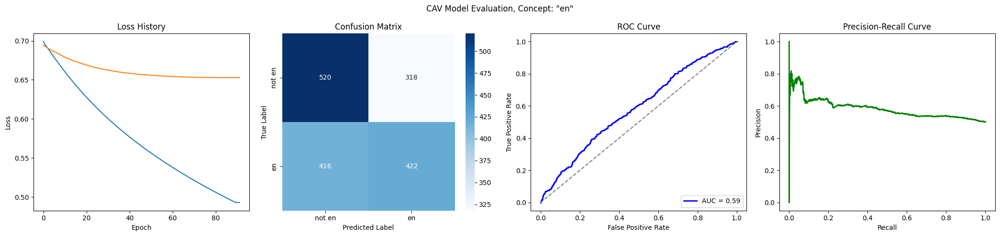

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6991
Epoch 1 Validation Loss: 0.6987
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6596
Epoch 11 Validation Loss: 0.6782
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6270
Epoch 21 Validation Loss: 0.6672
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5994
Epoch 31 Validation Loss: 0.6619
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5752
Epoch 41 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5536
Epoch 51 Validation Loss: 0.6584
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/language_en/loss_history.json


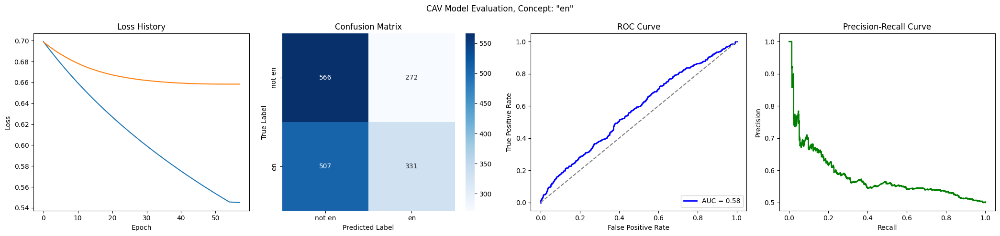

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6736
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6149
Epoch 21 Validation Loss: 0.6632
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5870
Epoch 31 Validation Loss: 0.6569
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5630
Epoch 41 Validation Loss: 0.6530
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5417
Epoch 51 Validation Loss: 0.6502
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5225
Epoch 61 Validation Loss: 0.6480
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5051
Epoch 71 Validation Loss: 0.6462
Model saved to trai

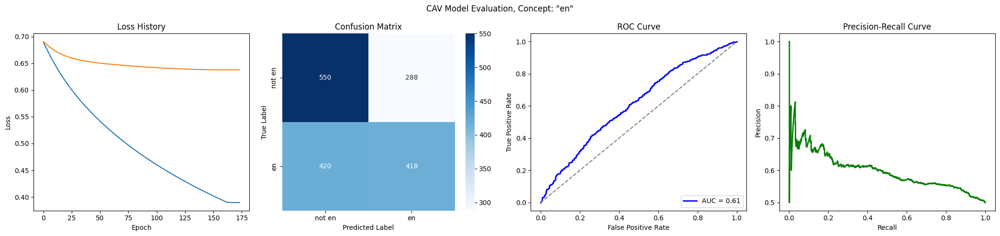

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6701
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6153
Epoch 21 Validation Loss: 0.6572
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5863
Epoch 31 Validation Loss: 0.6497
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5619
Epoch 41 Validation Loss: 0.6453
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5406
Epoch 51 Validation Loss: 0.6425
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5215
Epoch 61 Validation Loss: 0.6407
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5042
Epoch 71 Validation Loss: 0.6398
Model saved to trai

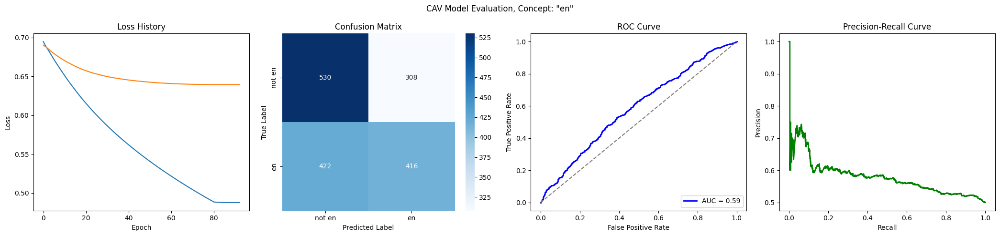

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6616
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6310
Epoch 21 Validation Loss: 0.6675
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6044
Epoch 31 Validation Loss: 0.6600
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5807
Epoch 41 Validation Loss: 0.6539
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5594
Epoch 51 Validation Loss: 0.6490
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5400
Epoch 61 Validation Loss: 0.6451
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5224
Epoch 71 Validation Loss: 0.6420
Model saved to trai

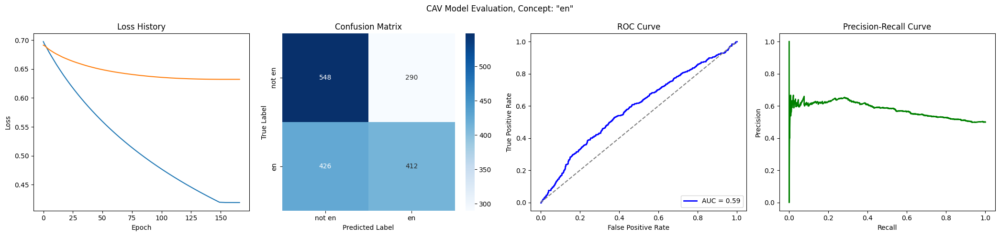

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6674
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6195
Epoch 21 Validation Loss: 0.6548
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5918
Epoch 31 Validation Loss: 0.6470
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5676
Epoch 41 Validation Loss: 0.6421
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5461
Epoch 51 Validation Loss: 0.6390
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5268
Epoch 61 Validation Loss: 0.6369
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5092
Epoch 71 Validation Loss: 0.6357
Model saved to trai

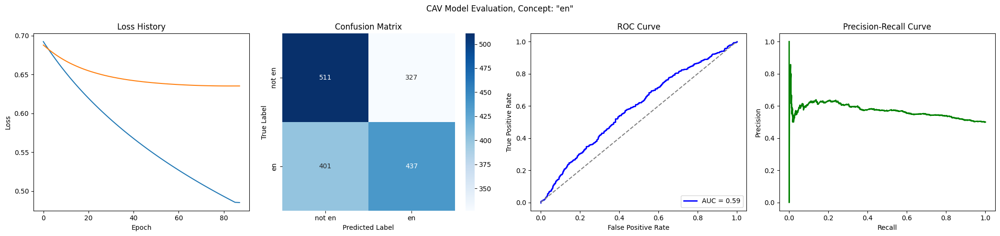

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6598
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6296
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6033
Epoch 31 Validation Loss: 0.6721
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5798
Epoch 41 Validation Loss: 0.6704
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5588
Epoch 51 Validation Loss: 0.6695
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5398
Epoch 61 Validation Loss: 0.6692
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5320
Epoch 71 Validation Loss: 0.6691
Model saved to trai

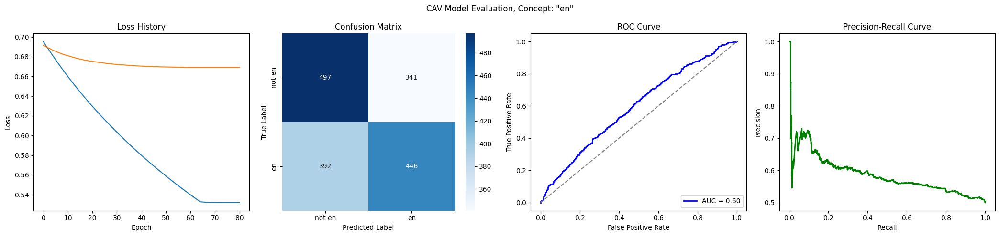

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6620
Epoch 11 Validation Loss: 0.6761
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6329
Epoch 21 Validation Loss: 0.6653
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6081
Epoch 31 Validation Loss: 0.6577
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5862
Epoch 41 Validation Loss: 0.6520
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5664
Epoch 51 Validation Loss: 0.6473
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5483
Epoch 61 Validation Loss: 0.6434
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5317
Epoch 71 Validation Loss: 0.6405
Model saved to trai

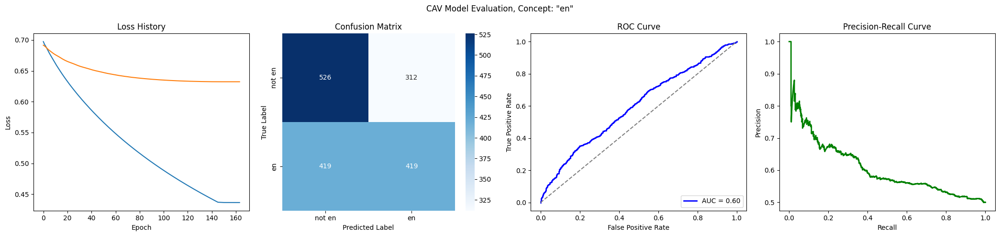

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6301
Epoch 21 Validation Loss: 0.6635
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6049
Epoch 31 Validation Loss: 0.6544
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5824
Epoch 41 Validation Loss: 0.6472
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5619
Epoch 51 Validation Loss: 0.6410
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5430
Epoch 61 Validation Loss: 0.6355
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5254
Epoch 71 Validation Loss: 0.6306
Model saved to trai

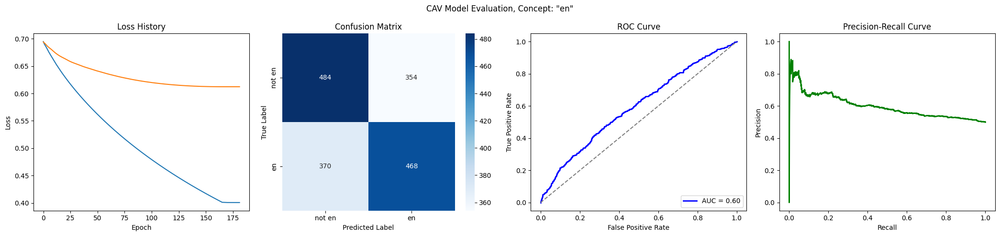

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6468
Epoch 11 Validation Loss: 0.6680
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6102
Epoch 21 Validation Loss: 0.6552
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5802
Epoch 31 Validation Loss: 0.6472
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5548
Epoch 41 Validation Loss: 0.6420
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5325
Epoch 51 Validation Loss: 0.6383
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5126
Epoch 61 Validation Loss: 0.6358
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4947
Epoch 71 Validation Loss: 0.6341
Model saved to trai

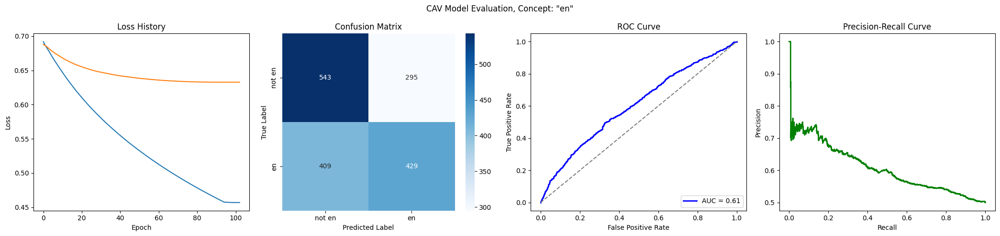

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7045
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6643
Epoch 11 Validation Loss: 0.6747
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6342
Epoch 21 Validation Loss: 0.6589
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6094
Epoch 31 Validation Loss: 0.6500
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5886
Epoch 41 Validation Loss: 0.6444
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5705
Epoch 51 Validation Loss: 0.6403
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5540
Epoch 61 Validation Loss: 0.6368
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5389
Epoch 71 Validation Loss: 0.6337
Model saved to trai

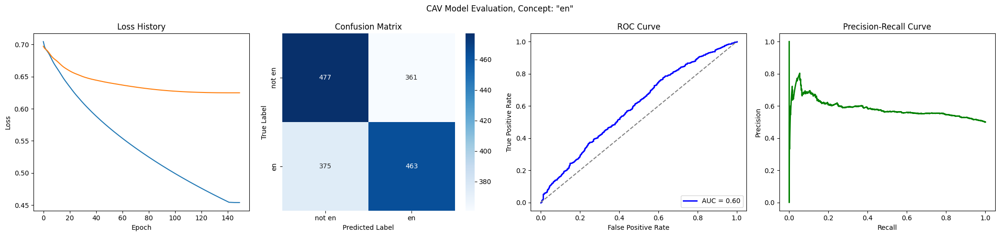

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6587
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6271
Epoch 21 Validation Loss: 0.6669
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6004
Epoch 31 Validation Loss: 0.6609
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5771
Epoch 41 Validation Loss: 0.6565
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5564
Epoch 51 Validation Loss: 0.6533
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5376
Epoch 61 Validation Loss: 0.6511
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5206
Epoch 71 Validation Loss: 0.6498
Model saved to trai

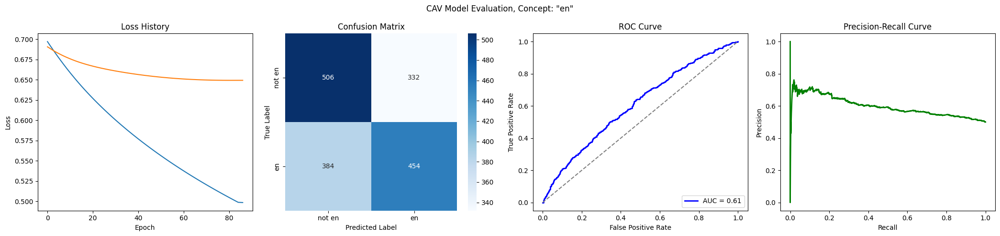

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6612
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6302
Epoch 21 Validation Loss: 0.6726
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6040
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5807
Epoch 41 Validation Loss: 0.6658
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5596
Epoch 51 Validation Loss: 0.6642
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5403
Epoch 61 Validation Loss: 0.6627
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5224
Epoch 71 Validation Loss: 0.6611
Model saved to trai

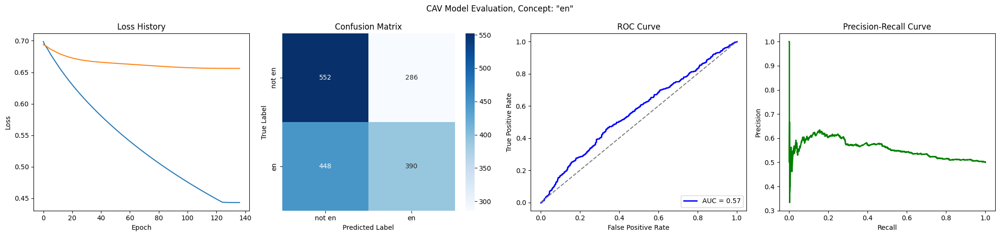

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6546
Epoch 11 Validation Loss: 0.6848
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6213
Epoch 21 Validation Loss: 0.6816
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5930
Epoch 31 Validation Loss: 0.6803
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5681
Epoch 41 Validation Loss: 0.6796
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5460
Epoch 51 Validation Loss: 0.6793
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5430
Epoch 61 Validation Loss: 0.6793
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5429
Epoch 71 Validation Loss: 0.6793
Early stopping at e

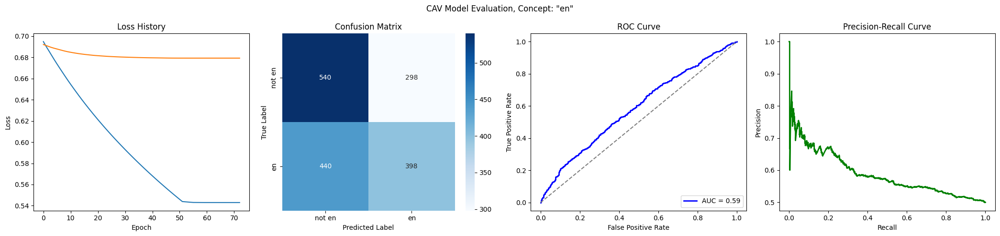

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7019
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6623
Epoch 11 Validation Loss: 0.6853
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6315
Epoch 21 Validation Loss: 0.6808
Model saved to trainings/language_en/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/language_en/loss_history.json


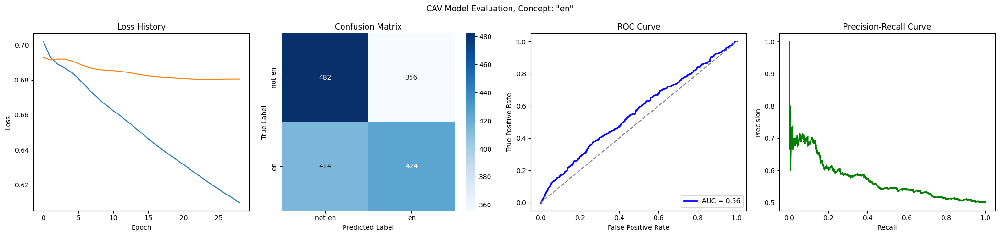

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6716
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6189
Epoch 21 Validation Loss: 0.6525
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5896
Epoch 31 Validation Loss: 0.6377
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5644
Epoch 41 Validation Loss: 0.6260
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5420
Epoch 51 Validation Loss: 0.6164
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5220
Epoch 61 Validation Loss: 0.6084
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5037
Epoch 71 Validation Loss: 0.6017
Model saved to trai

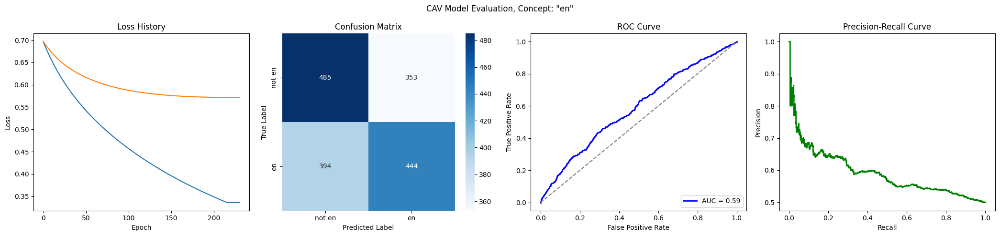

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6579
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6249
Epoch 21 Validation Loss: 0.6779
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5967
Epoch 31 Validation Loss: 0.6754
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5717
Epoch 41 Validation Loss: 0.6743
Early stopping at epoch 44
Loss history saved to trainings/language_en/loss_history.json


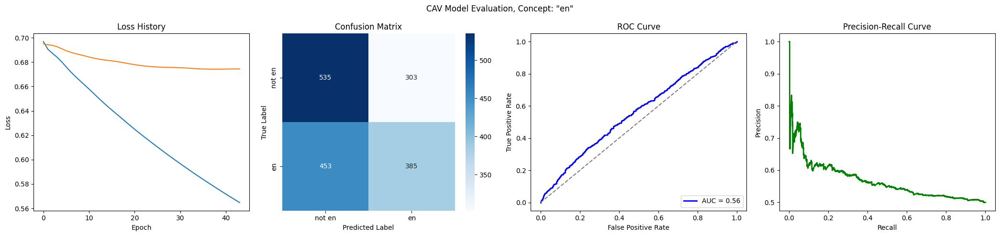

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6917
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6519
Epoch 11 Validation Loss: 0.6742
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6181
Epoch 21 Validation Loss: 0.6645
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5894
Epoch 31 Validation Loss: 0.6582
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5644
Epoch 41 Validation Loss: 0.6543
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5422
Epoch 51 Validation Loss: 0.6518
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5221
Epoch 61 Validation Loss: 0.6501
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5038
Epoch 71 Validation Loss: 0.6491
Model saved to trai

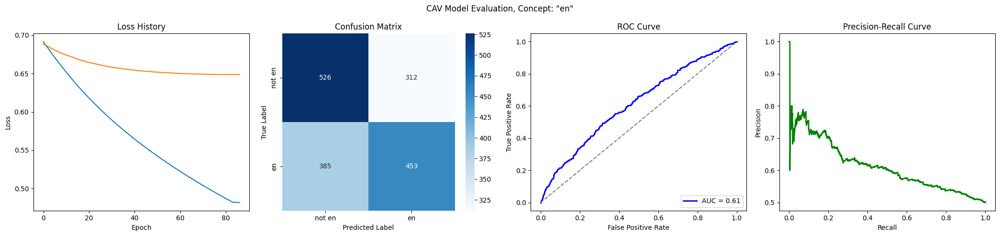

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6967
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6228
Epoch 21 Validation Loss: 0.6727
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5935
Epoch 31 Validation Loss: 0.6660
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5680
Epoch 41 Validation Loss: 0.6620
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5452
Epoch 51 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5246
Epoch 61 Validation Loss: 0.6572
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5056
Epoch 71 Validation Loss: 0.6561
Model saved to trai

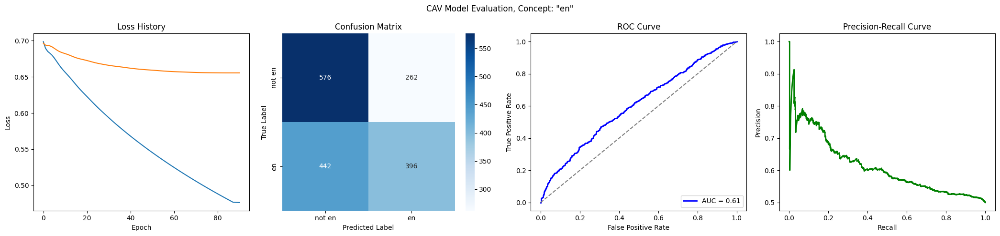

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6907
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6490
Epoch 11 Validation Loss: 0.6876
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6160
Epoch 21 Validation Loss: 0.6842
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5888
Epoch 31 Validation Loss: 0.6837
Epoch 41/500
Epoch 41 Train Loss: 0.5877
Epoch 41 Validation Loss: 0.6837
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5877
Epoch 51 Validation Loss: 0.6837
Early stopping at epoch 51
Loss history saved to trainings/language_en/loss_history.json


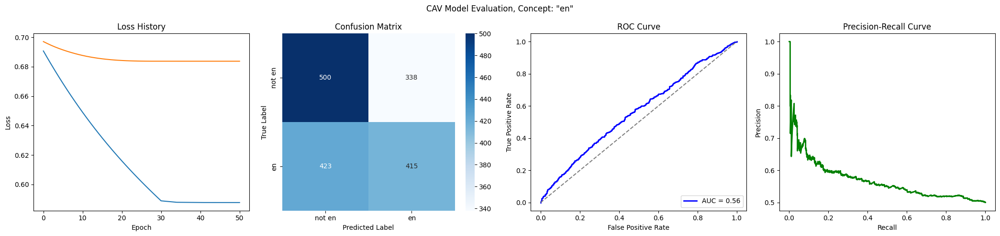

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6478
Epoch 11 Validation Loss: 0.6699
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6114
Epoch 21 Validation Loss: 0.6580
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5807
Epoch 31 Validation Loss: 0.6511
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5540
Epoch 41 Validation Loss: 0.6474
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5303
Epoch 51 Validation Loss: 0.6457
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5108
Epoch 61 Validation Loss: 0.6454
Early stopping at epoch 63
Loss history saved to trainings/language_en/loss_history.json


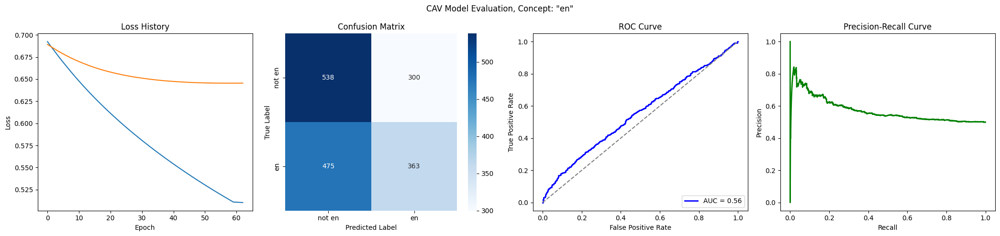

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6215
Epoch 21 Validation Loss: 0.6593
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5949
Epoch 31 Validation Loss: 0.6491
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5719
Epoch 41 Validation Loss: 0.6406
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5513
Epoch 51 Validation Loss: 0.6334
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5327
Epoch 61 Validation Loss: 0.6274
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5156
Epoch 71 Validation Loss: 0.6228
Model saved to trai

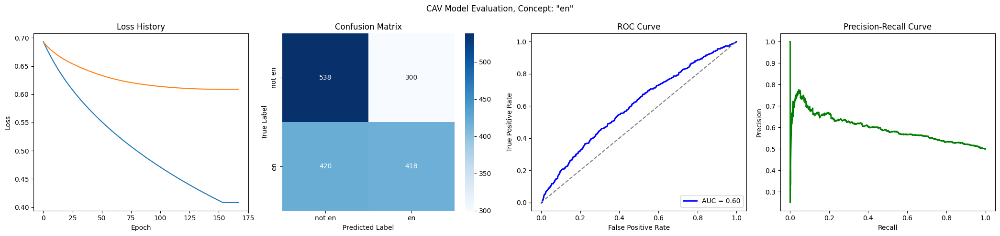

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6876
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6167
Epoch 21 Validation Loss: 0.6632
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5866
Epoch 31 Validation Loss: 0.6573
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5604
Epoch 41 Validation Loss: 0.6535
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5371
Epoch 51 Validation Loss: 0.6502
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5162
Epoch 61 Validation Loss: 0.6474
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4971
Epoch 71 Validation Loss: 0.6455
Model saved to trai

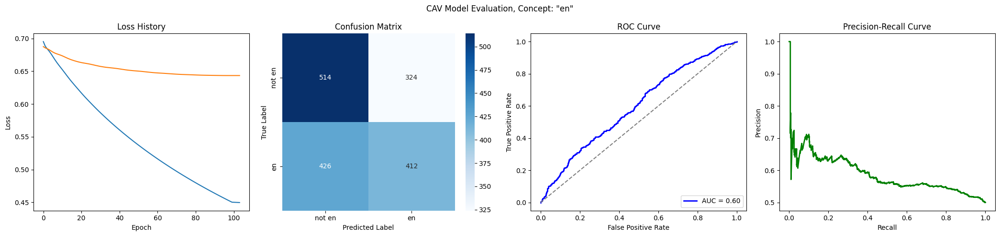

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6530
Epoch 11 Validation Loss: 0.6739
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6176
Epoch 21 Validation Loss: 0.6604
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5877
Epoch 31 Validation Loss: 0.6513
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5623
Epoch 41 Validation Loss: 0.6452
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5400
Epoch 51 Validation Loss: 0.6410
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5201
Epoch 61 Validation Loss: 0.6383
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5020
Epoch 71 Validation Loss: 0.6368
Model saved to trai

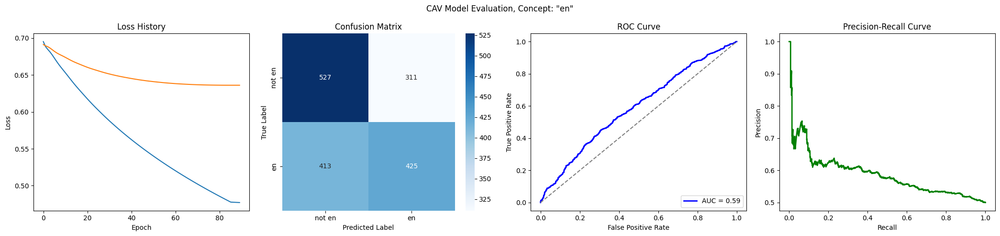

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6575
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6237
Epoch 21 Validation Loss: 0.6686
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5950
Epoch 31 Validation Loss: 0.6634
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5700
Epoch 41 Validation Loss: 0.6613
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5479
Epoch 51 Validation Loss: 0.6605
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5314
Epoch 61 Validation Loss: 0.6604
Early stopping at epoch 61
Loss history saved to trainings/language_en/loss_history.json


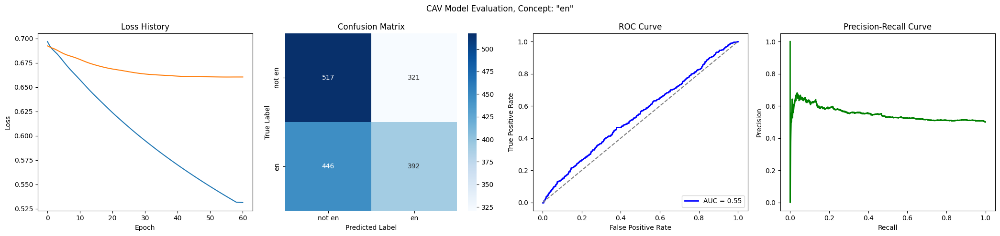

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6618
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6328
Epoch 21 Validation Loss: 0.6742
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6072
Epoch 31 Validation Loss: 0.6708
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5838
Epoch 41 Validation Loss: 0.6699
Early stopping at epoch 44
Loss history saved to trainings/language_en/loss_history.json


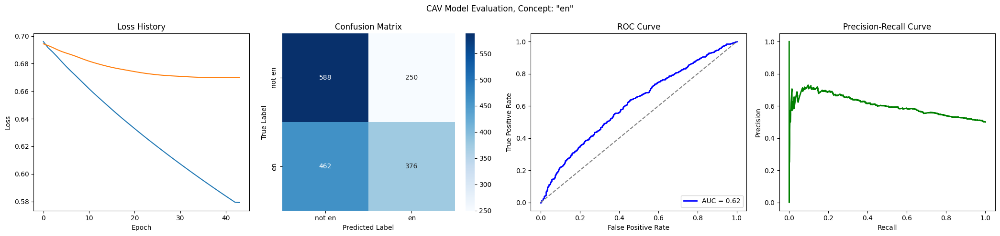

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6857
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6671
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6083
Epoch 21 Validation Loss: 0.6570
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5793
Epoch 31 Validation Loss: 0.6512
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5541
Epoch 41 Validation Loss: 0.6476
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5315
Epoch 51 Validation Loss: 0.6455
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5111
Epoch 61 Validation Loss: 0.6444
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4924
Epoch 71 Validation Loss: 0.6440
Model saved to tra

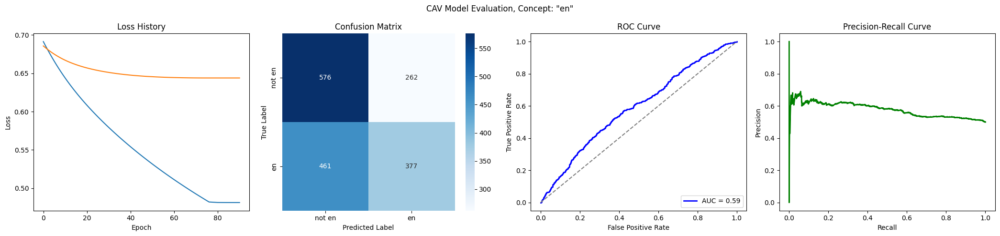

CPU times: user 13min 45s, sys: 13min 11s, total: 26min 57s
Wall time: 2h 21min 26s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

972

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


8744 972
Epoch 1/500
Epoch 1 Train Loss: 0.6658
Epoch 1 Validation Loss: 0.6404
Model saved to trainings/language_en/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5565
Epoch 11 Validation Loss: 0.5602
Model saved to trainings/language_en/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5299
Epoch 21 Validation Loss: 0.5413
Model saved to trainings/language_en/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5141
Epoch 31 Validation Loss: 0.5312
Model saved to trainings/language_en/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5027
Epoch 41 Validation Loss: 0.5245
Model saved to trainings/language_en/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4938
Epoch 51 Validation Loss: 0.5194
Model saved to trainings/language_en/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4866
Epoch 61 Validation Loss: 0.5155
Model saved to trainings/language_en/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4805
Epoch 71 Validation Loss: 0.5123
Model saved to trainings/language_en/s

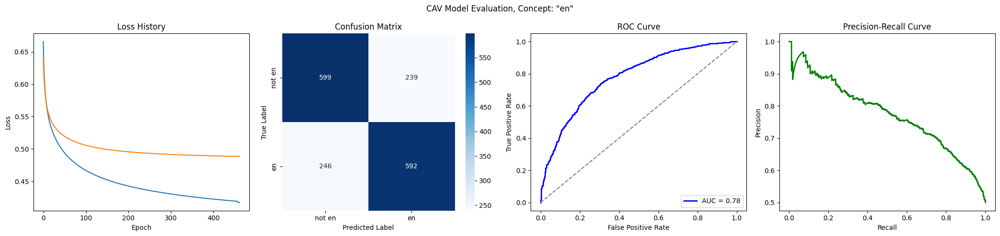

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
